# <p style="background-color:purple;font-family:newtimeroman;font-size:200%;color:white;text-align:center;border-radius:20px 20px;"><b> Linear Regression Project (CO2 Emissions)</b></p>

**About Dataset**
- This dataset contains information about various vehicles' carbon dioxide (CO2) emissions and fuel consumption. 
- In the context of Machine Learning (ML), this dataset is often used to predict CO2 emissions based on vehicle characteristics or to analyze fuel efficiency of vehicles. 
- The goal could be to predict CO2 emissions or fuel consumption based on the features of the vehicles.
- There are total 7385 rows and 12 columns. 

**The columns in the dataset can be described as follows:**

1. **Make**: The brand of the vehicle.
2. **Model**: The model of the vehicle.
3. **Vehicle Class**: The class of the vehicle (e.g., compact, SUV).
4. **Engine Size(L)**: The engine size in liters.
5. **Cylinders**: The number of cylinders in the engine.
6. **Transmission**: The type of transmission (e.g., automatic, manual).
7. **Fuel Type**: The type of fuel used (e.g., gasoline, diesel).
8. **Fuel Consumption City (L/100 km)**: Fuel consumption in the city (liters per 100 kilometers).
9. **Fuel Consumption Hwy (L/100 km)**: Highway (out-of-city) fuel consumption.
10. **Fuel Consumption Comb (L/100 km)**: Combined (city and highway) fuel consumption.
11. **Fuel Consumption Comb (mpg)**: Combined fuel consumption in miles per gallon.
12. **CO2 Emissions(g/km)**: CO2 emissions in grams per kilometer.

**Model**

**The "Model" column includes terms that identify specific features or configurations of vehicles:**
- `4WD/4X4`: Four-wheel drive. A drive system where all four wheels receive power.
- `AWD`: All-wheel drive. Similar to 4WD but often with more complex mechanisms for power distribution.
- `FFV`: Flexible-fuel vehicle. Vehicles that can use multiple types of fuel, such as both gasoline and ethanol blends.
- `SWB`: Short wheelbase.
- `LWB`: Long wheelbase.
- `EWB`: Extended wheelbase.

**Transmission**

**The "Transmission" column indicates the type of transmission system in the vehicle:**
- `A`: Automatic. A transmission type that operates without the need for the driver to manually change gears.
- `AM`: Automated manual. A version of a manual transmission that is automated.
- `AS`: Automatic with select shift. An automatic transmission that allows for manual intervention.
- `AV`: Continuously variable. A transmission that uses continuously varying ratios instead of fixed gear ratios.
- `M`: Manual. A transmission type that requires the driver to manually change gears.
- `3 - 10`: Number of gears in the transmission.

**Fuel Type**

**The "Fuel Type" column specifies the type of fuel used by the vehicle:**
- `X`: Regular gasoline.
- `Z`: Premium gasoline.
- `D`: Diesel.
- `E`: Ethanol (E85).
- `N`: Natural gas.

**Vehicle Class**

**The "Vehicle Class" column categorizes vehicles by size and type:**
- `COMPACT`: Smaller-sized vehicles.
- `SUV - SMALL`: Smaller-sized sports utility vehicles.
- `MID-SIZE`: Medium-sized vehicles.
- `TWO-SEATER`: Vehicles with two seats.
- `MINICOMPACT`: Very small-sized vehicles.
- `SUBCOMPACT`: Smaller than compact-sized vehicles.
- `FULL-SIZE`: Larger-sized vehicles.
- `STATION WAGON - SMALL`: Smaller-sized station wagons.
- `SUV - STANDARD`: Standard-sized sports utility vehicles.
- `VAN - CARGO`: Vans designed for cargo.
- `VAN - PASSENGER`: Vans designed for passenger transportation.
- `PICKUP TRUCK - STANDARD`: Standard-sized pickup trucks.
- `MINIVAN`: Smaller-sized vans.
- `SPECIAL PURPOSE VEHICLE`: Vehicles designed for special purposes.
- `STATION WAGON - MID-SIZE`: Mid-sized station wagons.
- `PICKUP TRUCK - SMALL`: Smaller-sized pickup trucks.

This dataset can be used to understand the fuel efficiency and environmental impact of vehicles. Machine learning models can use these features to predict CO2 emissions or perform analyses comparing the fuel consumption of different vehicles.

For further (more) information: https://www.kaggle.com/datasets/debajyotipodder/co2-emission-by-vehicles/data

# <font color='darkviolet'> <b>Data Preparation-EDA and Data Cleaning</b><font color='black'>

In [35]:
#!pip install pandas
#!pip install numpy

#!pip install matplotlib
#!pip install seaborn
#!pip install scikit-learn 
#!pip install sklearn
#pip install plotly


#!pip install missingno 
#!pip install summarytools
#!pip install ydata-profiling

# pip install inflection
# pip install skimpy

## <font color='blue'> <b>Import Library</b><font color='black'>

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
 
#%matplotlib inline  

import warnings
warnings.filterwarnings('ignore')
plt.rcParams["figure.figsize"] = (10,6)
pd.set_option('display.max_columns', 100)

import scipy.stats as stats
import inflection
from skimpy import clean_columns
import missingno as msno
import plotly.graph_objects as go
from scipy.stats import skew

## <font color='blue'> <b>Read Dataset</b><font color='black'>

In [16]:
co2 = pd.read_csv('co2.csv')
df = co2.copy()
df

,Make,Model,Vehicle Class,Engine Size(L),Cylinders,Transmission,Fuel Type,Fuel Consumption City (L/100 km),Fuel Consumption Hwy (L/100 km),Fuel Consumption Comb (L/100 km),Fuel Consumption Comb (mpg),CO2 Emissions(g/km)
0,ACURA,ILX,COMPACT,2.0,4,AS5,Z,9.9,6.7,8.5,33,196
1,ACURA,ILX,COMPACT,2.4,4,M6,Z,11.2,7.7,9.6,29,221
2,ACURA,ILX HYBRID,COMPACT,1.5,4,AV7,Z,6.0,5.8,5.9,48,136
3,ACURA,MDX 4WD,SUV - SMALL,3.5,6,AS6,Z,12.7,9.1,11.1,25,255
4,ACURA,RDX AWD,SUV - SMALL,3.5,6,AS6,Z,12.1,8.7,10.6,27,244
...,...,...,...,...,...,...,...,...,...,...,...,...
7380,VOLVO,XC40 T5 AWD,SUV - SMALL,2.0,4,AS8,Z,10.7,7.7,9.4,30,219
7381,VOLVO,XC60 T5 AWD,SUV - SMALL,2.0,4,AS8,Z,11.2,8.3,9.9,29,232
7382,VOLVO,XC60 T6 AWD,SUV - SMALL,2.0,4,AS8,Z,11.7,8.6,10.3,27,240
7383,VOLVO,XC90 T5 AWD,SUV - STANDARD,2.0,4,AS8,Z,11.2,8.3,9.9,29,232


In [3]:
df.shape

(7385, 12)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7385 entries, 0 to 7384
Data columns (total 12 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   Make                              7385 non-null   object 
 1   Model                             7385 non-null   object 
 2   Vehicle Class                     7385 non-null   object 
 3   Engine Size(L)                    7385 non-null   float64
 4   Cylinders                         7385 non-null   int64  
 5   Transmission                      7385 non-null   object 
 6   Fuel Type                         7385 non-null   object 
 7   Fuel Consumption City (L/100 km)  7385 non-null   float64
 8   Fuel Consumption Hwy (L/100 km)   7385 non-null   float64
 9   Fuel Consumption Comb (L/100 km)  7385 non-null   float64
 10  Fuel Consumption Comb (mpg)       7385 non-null   int64  
 11  CO2 Emissions(g/km)               7385 non-null   int64  
dtypes: flo

In [5]:
df.isnull()

,Make,Model,Vehicle Class,Engine Size(L),Cylinders,Transmission,Fuel Type,Fuel Consumption City (L/100 km),Fuel Consumption Hwy (L/100 km),Fuel Consumption Comb (L/100 km),Fuel Consumption Comb (mpg),CO2 Emissions(g/km)
0,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...
7380,False,False,False,False,False,False,False,False,False,False,False,False
7381,False,False,False,False,False,False,False,False,False,False,False,False
7382,False,False,False,False,False,False,False,False,False,False,False,False
7383,False,False,False,False,False,False,False,False,False,False,False,False


In [6]:
df.isnull().sum()

Make                                0
Model                               0
Vehicle Class                       0
Engine Size(L)                      0
Cylinders                           0
Transmission                        0
Fuel Type                           0
Fuel Consumption City (L/100 km)    0
Fuel Consumption Hwy (L/100 km)     0
Fuel Consumption Comb (L/100 km)    0
Fuel Consumption Comb (mpg)         0
CO2 Emissions(g/km)                 0
dtype: int64

In [7]:
import missingno as msno

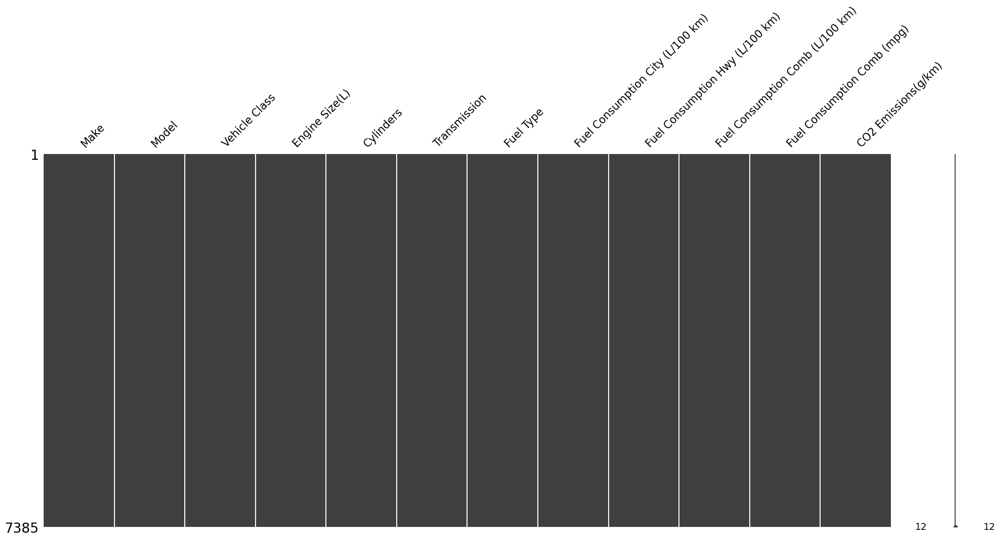

In [8]:
msno.matrix(df);

<Axes: >

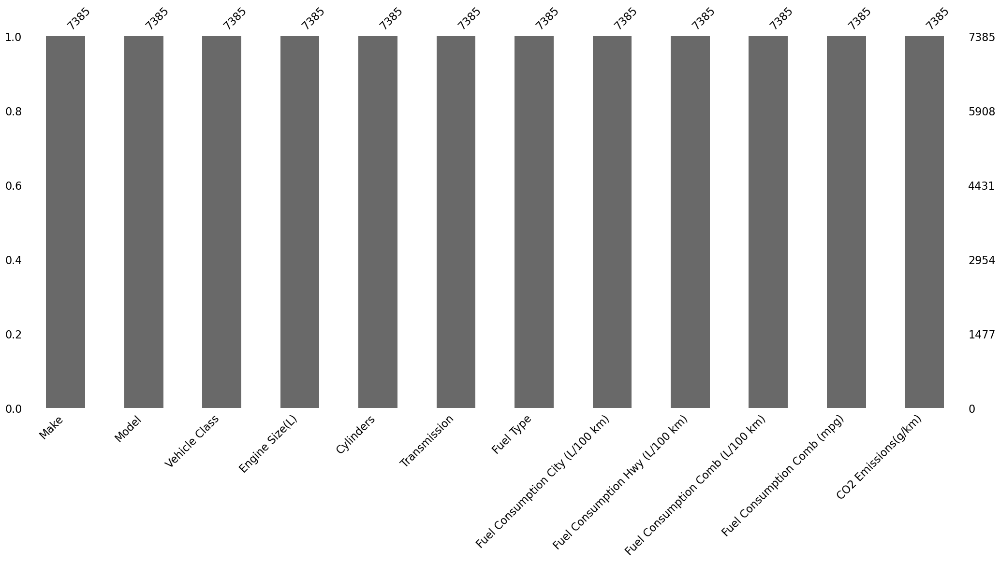

In [9]:
msno.bar(df)

In [119]:
missing_count = df.isnull().sum()
value_count = df.isnull().count()
missing_percentage = round(missing_count / value_count * 100, 2)
missing_df = pd.DataFrame({"count": missing_count, "percentage": missing_percentage})
missing_df

,count,percentage
Make,0,0.0
Model,0,0.0
Vehicle Class,0,0.0
Engine Size(L),0,0.0
Cylinders,0,0.0
Transmission,0,0.0
Fuel Type,0,0.0
Fuel Consumption City (L/100 km),0,0.0
Fuel Consumption Hwy (L/100 km),0,0.0
Fuel Consumption Comb (L/100 km),0,0.0


In [11]:
df.sort_values(by="CO2 Emissions(g/km)", ascending=False)

,Make,Model,Vehicle Class,Engine Size(L),Cylinders,Transmission,Fuel Type,Fuel Consumption City (L/100 km),Fuel Consumption Hwy (L/100 km),Fuel Consumption Comb (L/100 km),Fuel Consumption Comb (mpg),CO2 Emissions(g/km)
5575,BUGATTI,Chiron,TWO-SEATER,8.0,16,AM7,Z,26.8,16.6,22.2,13,522
6640,BUGATTI,Chiron,TWO-SEATER,8.0,16,AM7,Z,26.8,16.6,22.2,13,522
4509,BUGATTI,CHIRON,TWO-SEATER,8.0,16,AM7,Z,26.8,16.6,22.2,13,522
7059,LAMBORGHINI,Aventador Roadster,TWO-SEATER,6.5,12,AM7,Z,26.6,15.8,21.7,13,493
6046,LAMBORGHINI,Aventador Roadster,TWO-SEATER,6.5,12,AM7,Z,26.6,15.8,21.7,13,493
...,...,...,...,...,...,...,...,...,...,...,...,...
6949,HYUNDAI,IONIQ,FULL-SIZE,1.6,4,AM6,X,4.2,4.2,4.2,67,99
5931,HYUNDAI,IONIQ Blue,FULL-SIZE,1.6,4,AM6,X,4.2,4.0,4.1,69,96
4900,HYUNDAI,IONIQ BLUE,FULL-SIZE,1.6,4,AM6,X,4.2,4.0,4.1,69,96
6950,HYUNDAI,IONIQ Blue,FULL-SIZE,1.6,4,AM6,X,4.2,4.0,4.1,69,96


In [12]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Engine Size(L),7385.0,3.160068,1.354170,0.9,2.0,3.0,3.7,8.4
Cylinders,7385.0,5.615030,1.828307,3.0,4.0,6.0,6.0,16.0
Fuel Consumption City (L/100 km),7385.0,12.556534,3.500274,4.2,10.1,12.1,14.6,30.6
Fuel Consumption Hwy (L/100 km),7385.0,9.041706,2.224456,4.0,7.5,8.7,10.2,20.6
Fuel Consumption Comb (L/100 km),7385.0,10.975071,2.892506,4.1,8.9,10.6,12.6,26.1
Fuel Consumption Comb (mpg),7385.0,27.481652,7.231879,11.0,22.0,27.0,32.0,69.0
CO2 Emissions(g/km),7385.0,250.584699,58.512679,96.0,208.0,246.0,288.0,522.0


In [13]:
df.describe(include="object").T

,count,unique,top,freq
Make,7385,42,FORD,628
Model,7385,2053,F-150 FFV 4X4,32
Vehicle Class,7385,16,SUV - SMALL,1217
Transmission,7385,27,AS6,1324
Fuel Type,7385,5,X,3637


In [14]:
df.columns

Index(['Make', 'Model', 'Vehicle Class', 'Engine Size(L)', 'Cylinders',
       'Transmission', 'Fuel Type', 'Fuel Consumption City (L/100 km)',
       'Fuel Consumption Hwy (L/100 km)', 'Fuel Consumption Comb (L/100 km)',
       'Fuel Consumption Comb (mpg)', 'CO2 Emissions(g/km)'],
      dtype='object')

In [49]:
# First Method

#df.rename(columns={ 'Make': 'make',
                    'Model': 'model',
                    'Vehicle Class': 'vehicle_class',
                    'Engine Size(L)': 'engine_size',
                    'Cylinders': 'cylinders',
                    'Transmission': 'transmission',
                    'Fuel Type': 'fuel_type',
                    'Fuel Consumption City (L/100 km)': 'fuel_cons_city',
                    'Fuel Consumption Hwy (L/100 km)': 'fuel_cons_hwy',
                    'Fuel Consumption Comb (L/100 km)': 'fuel_cons_comb',
                    'Fuel Consumption Comb (mpg)': 'fuel_cons_comb_mpg',
                    'CO2 Emissions(g/km)': 'co2'
                    }, inplace=True)

IndentationError: unexpected indent (2409777363.py, line 4)

In [ ]:
#df.columns

In [ ]:
#Second method
#df.columns = [inflection.camelize(column, False) for column in df.columns]
#df.columns

In [ ]:
#df.columns = [inflection.underscore(column) for column in df.columns]
#df.columns

In [ ]:
#df.columns = [inflection.dasherize(inflection.underscore(column)).lower() for column in df.columns]
#df.columns

In [ ]:
#df.columns = [inflection.humanize(inflection.underscore(column)) for column in df.columns]
#df.columns

In [ ]:
#df.columns = [inflection.titleize(column).replace(' ', '') for column in df.columns]
#df.columns

In [ ]:
### Third method
#df1 = clean_columns(df)
df1.columns

In [ ]:
#for i in df.columns:
    print(i)

In [ ]:
#missing_count = df.isnull().sum()
#value_count = df.isnull().count()
#missing_percentage = round(missing_count / value_count * 100, 2)
#missing_df = pd.DataFrame({"count": missing_count, "percentage": missing_percentage})
#missing_df


## <font color='blue'> <b>Make</b><font color='black'>

In [4]:
df.Make.unique()

array(['ACURA', 'ALFA ROMEO', 'ASTON MARTIN', 'AUDI', 'BENTLEY', 'BMW',
       'BUICK', 'CADILLAC', 'CHEVROLET', 'CHRYSLER', 'DODGE', 'FIAT',
       'FORD', 'GMC', 'HONDA', 'HYUNDAI', 'INFINITI', 'JAGUAR', 'JEEP',
       'KIA', 'LAMBORGHINI', 'LAND ROVER', 'LEXUS', 'LINCOLN', 'MASERATI',
       'MAZDA', 'MERCEDES-BENZ', 'MINI', 'MITSUBISHI', 'NISSAN',
       'PORSCHE', 'RAM', 'ROLLS-ROYCE', 'SCION', 'SMART', 'SRT', 'SUBARU',
       'TOYOTA', 'VOLKSWAGEN', 'VOLVO', 'GENESIS', 'BUGATTI'],
      dtype=object)

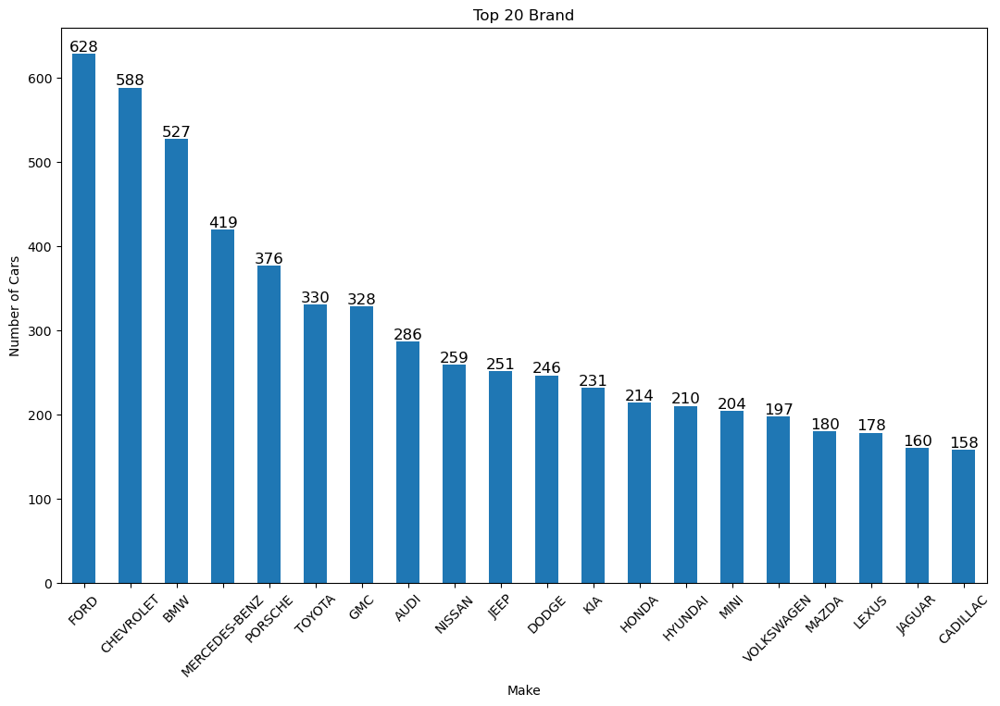

In [5]:
fig = plt.figure(figsize = (10,6))
ax = fig.add_axes([0,0,1,1])
counts = df.Make.value_counts().sort_values(ascending=False).head(20) # [0:20]
counts.plot(kind = "bar")
plt.title('Top 20 Brand')   
plt.xlabel('Make') 
plt.ylabel('Number of Cars')
plt.xticks(rotation = 45)
ax.bar_label(ax.containers[0], labels=counts.values, fontsize=12);

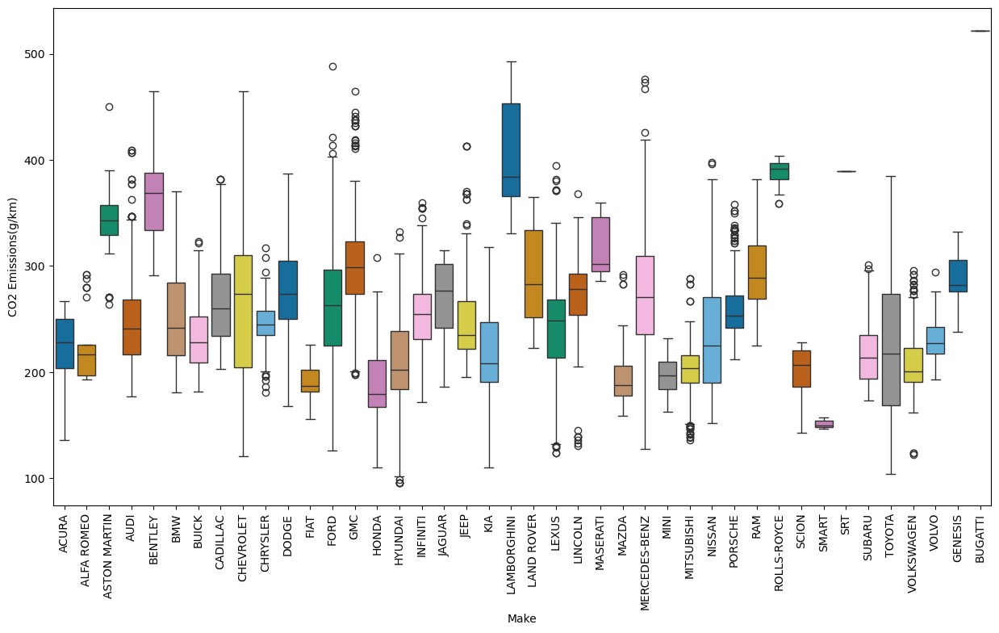

In [6]:
plt.figure(figsize=(15,8))
sns.boxplot(x="Make", y="CO2 Emissions(g/km)", data=df, palette="colorblind")  # 'colorblind' yerine istediğiniz bir palet adı kullanılabilir.
plt.xticks(rotation=90)
plt.show()

# When analyzing the "co2" values grouped by the "make" variable using a boxplot in Machine Learning (ML), it's important to approach outliers with a specific perspective.
# In ML, if an observation represents real-world data, we typically do not treat it as an outlier in the traditional statistical sense.
# The approach to outliers in ML is more about assessing whether there is sufficient data for training.
# This involves evaluating if the number of values that fall significantly outside of the normal distribution or outside the whiskers of a boxplot is substantial.
# If this number is low, it might be concluded that there is not enough data for effective training, and thus, an outlier treatment might be considered necessary.
# This approach is aimed at determining the adequacy of outlier data for training purposes, rather than outright removal or correction based on statistical distribution characteristics alone.

## <font color='blue'> <b>Model</b><font color='black'>

In [7]:
df.Model.unique()

array(['ILX', 'ILX HYBRID', 'MDX 4WD', ...,
       'Tacoma 4WD D-Cab TRD Off-Road/Pro', 'Atlas Cross Sport 4MOTION',
       'XC40 T4 AWD'], dtype=object)

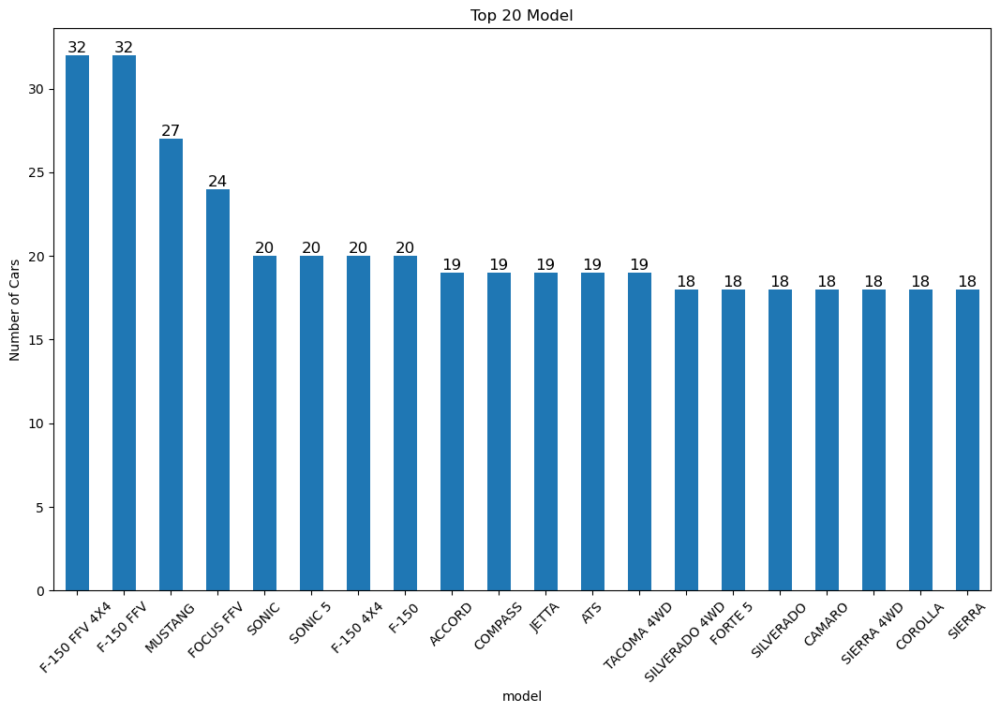

In [8]:
fig = plt.figure(figsize = (10,6))
ax = fig.add_axes([0,0,1,1])
counts = df.Model.value_counts().sort_values(ascending=False).head(20)
counts.plot(kind = "bar" )
plt.title('Top 20 Model')   
plt.xlabel('model') 
plt.ylabel('Number of Cars')
plt.xticks(rotation = 45)
ax.bar_label(ax.containers[0], labels=counts.values, fontsize=12);

## <font color='blue'> <b>Vehicle Class</b><font color='black'>

In [9]:
df['Vehicle Class'].unique()

array(['COMPACT', 'SUV - SMALL', 'MID-SIZE', 'TWO-SEATER', 'MINICOMPACT',
       'SUBCOMPACT', 'FULL-SIZE', 'STATION WAGON - SMALL',
       'SUV - STANDARD', 'VAN - CARGO', 'VAN - PASSENGER',
       'PICKUP TRUCK - STANDARD', 'MINIVAN', 'SPECIAL PURPOSE VEHICLE',
       'STATION WAGON - MID-SIZE', 'PICKUP TRUCK - SMALL'], dtype=object)

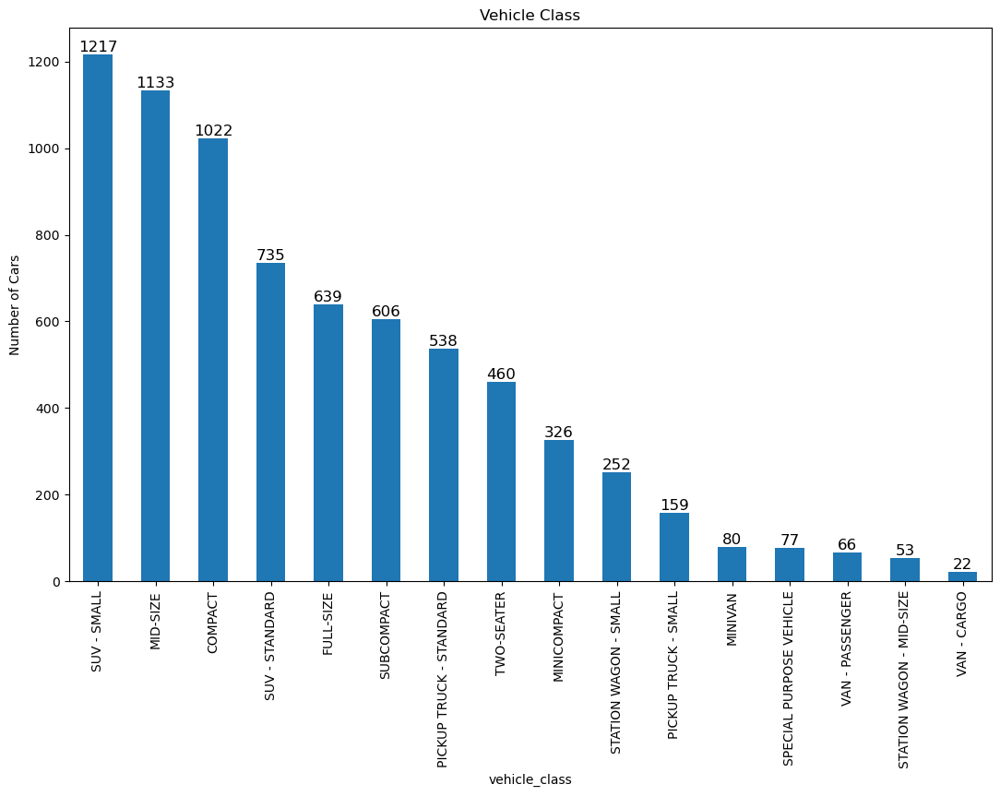

In [10]:
fig = plt.figure(figsize = (10,6))
ax = fig.add_axes([0,0,1,1])
counts = df['Vehicle Class'].value_counts().sort_values(ascending=False)
counts.plot(kind = "bar")
plt.title('Vehicle Class')   
plt.xlabel('vehicle_class') 
plt.ylabel('Number of Cars')
plt.xticks(rotation = 90)
ax.bar_label(ax.containers[0], labels=counts.values, fontsize=12);

In [11]:
transmission_distr =df['Vehicle Class'].value_counts().reset_index(name='count')
transmission_distr.columns = ['Vehicle Class','count']  # Make sure this matches your DataFrame columns

fig = px.pie(transmission_distr, values='count', names='Vehicle Class', title="Vehicle Class Distribution")
fig.show()

## <font color='blue'> <b>Engine Size</b><font color='black'>

In [59]:
df["Engine Size(L)"].unique()

array([2. , 2.4, 1.5, 3.5, 3.7, 1.8, 5.9, 4.7, 3. , 4. , 6.3, 4.2, 5.2,
       6. , 6.8, 4.4, 3.6, 1.4, 2.5, 6.2, 4.3, 5.3, 4.8, 1.2, 5.7, 6.4,
       4.6, 5.4, 1.6, 5. , 1. , 5.8, 3.8, 3.3, 5.6, 3.2, 6.5, 5.5, 2.1,
       3.4, 2.7, 6.6, 6.7, 1.3, 8.4, 2.3, 2.8, 0.9, 2.9, 8. , 2.2])

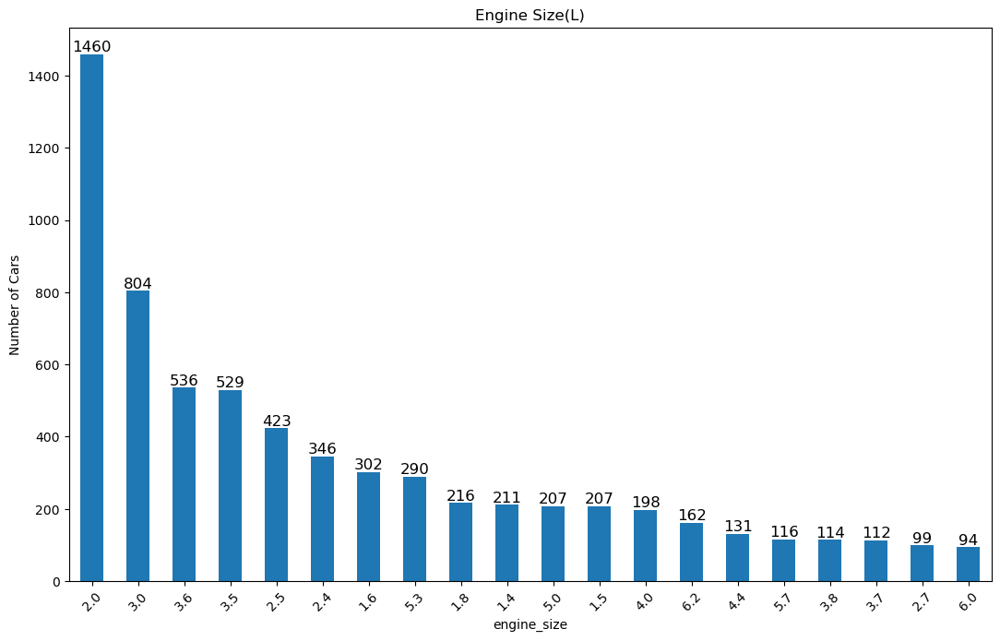

In [60]:
fig = plt.figure(figsize = (10,6))
ax = fig.add_axes([0,0,1,1])
counts = df["Engine Size(L)"].value_counts().sort_values(ascending=False).head(20)
counts.plot(kind = "bar")
plt.title("Engine Size(L)")   
plt.xlabel('engine_size') 
plt.ylabel('Number of Cars')
plt.xticks(rotation = 45)
ax.bar_label(ax.containers[0], labels=counts.values, fontsize=12);

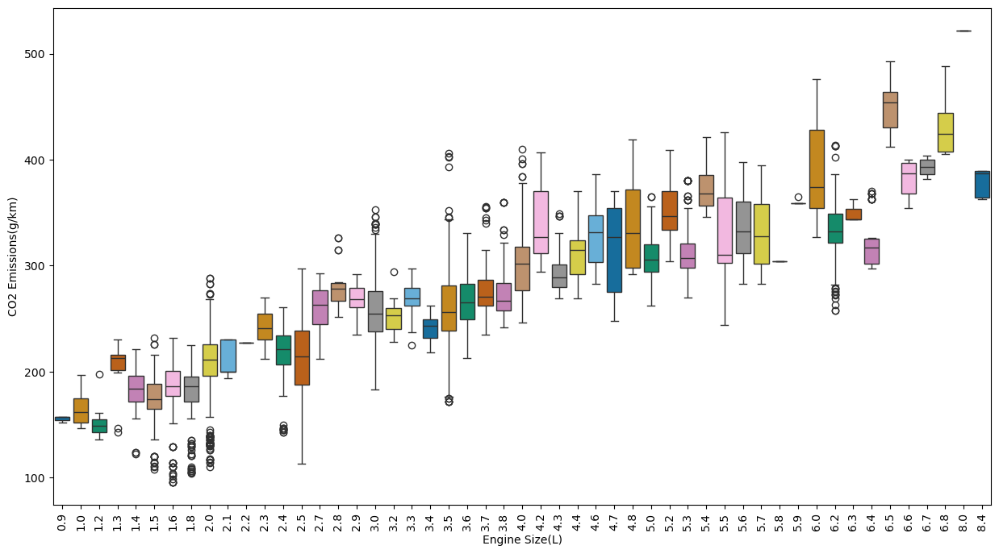

In [30]:
plt.figure(figsize = (15,8))
sns.boxplot(x= "Engine Size(L)", y= "CO2 Emissions(g/km)", data=df, palette="colorblind")
plt.xticks(rotation = 90);

## <font color='blue'> <b>Cylinders</b><font color='black'>

In [31]:
df.Cylinders.value_counts().sort_values(ascending=False)

Cylinders
4     3220
6     2446
8     1402
12     151
3       95
10      42
5       26
16       3
Name: count, dtype: int64

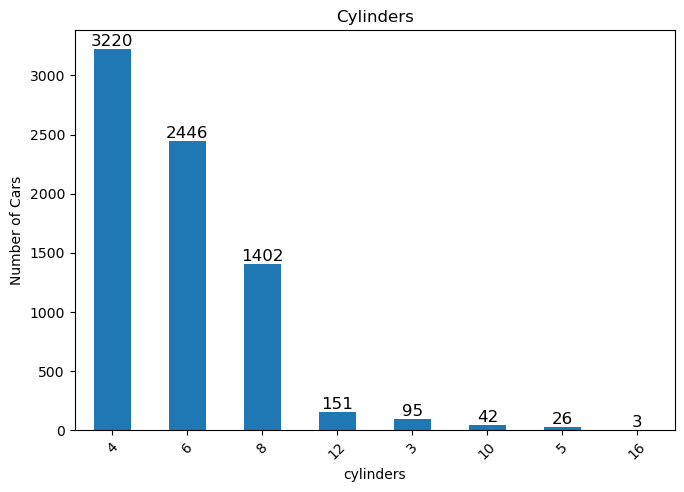

In [32]:
fig = plt.figure(figsize = (6,4))
ax = fig.add_axes([0,0,1,1])
counts = df.Cylinders.value_counts().sort_values(ascending=False).head(20)
counts.plot(kind = "bar")
plt.title('Cylinders')   
plt.xlabel('cylinders') 
plt.ylabel('Number of Cars')
plt.xticks(rotation = 45)
ax.bar_label(ax.containers[0], labels=counts.values, fontsize=12);

In [33]:
%matplotlib inline  

In [34]:
transmission_distr = df['Cylinders'].value_counts().reset_index(name='count')
transmission_distr.columns = ['Cylinders', 'count']  

fig = px.pie(transmission_distr, values='count', names='Cylinders', title="Cylinders Distribution")
fig.show()

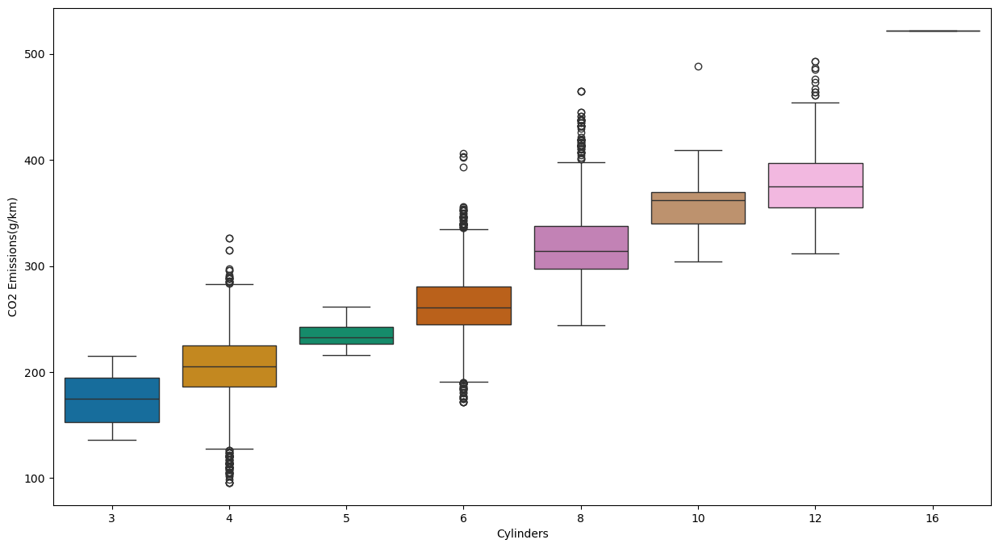

In [37]:
plt.figure(figsize = (15,8))
sns.boxplot(x="Cylinders", y="CO2 Emissions(g/km)", data=df, palette="colorblind");

# 16 silindrin boxplotu 3 satır olmasında rağmen duplicated olduğu için tek değer gibi gözüküyor

## <font color='blue'> <b>Transmission</b><font color='black'>

In [62]:
df.Transmission.value_counts().sort_values(ascending=False)

Transmission
AS6     1324
AS8     1211
M6       901
A6       789
A8       490
AM7      445
A9       339
AS7      319
AV       295
M5       193
AS10     168
AM6      132
AV7      118
AV6      113
M7        91
A5        84
AS9       77
A4        65
AM8       62
A7        53
AV8       39
A10       31
AS5       26
AV10      11
AM5        4
AM9        3
AS4        2
Name: count, dtype: int64

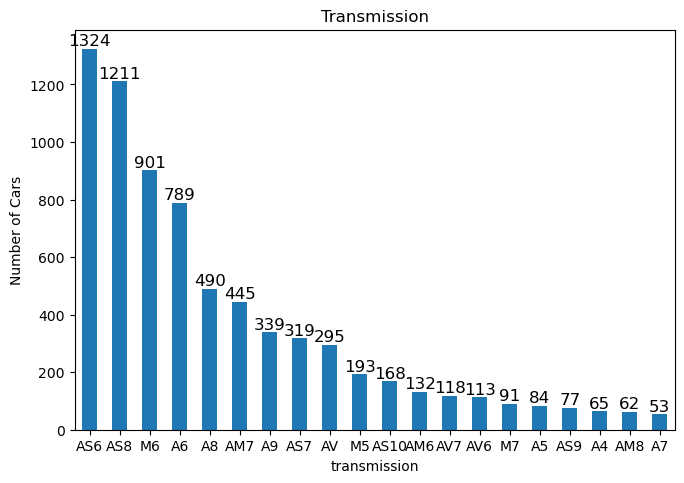

In [63]:
fig = plt.figure(figsize = (6,4))
ax = fig.add_axes([0,0,1,1])
counts = df.Transmission.value_counts().sort_values(ascending=False).head(20)
counts.plot(kind = "bar")
plt.title('Transmission')   
plt.xlabel('transmission') 
plt.ylabel('Number of Cars')
plt.xticks(rotation = 0)
ax.bar_label(ax.containers[0], labels=counts.values, fontsize=12);

In [64]:
transmission_distr = df['Transmission'].value_counts().reset_index()
transmission_distr.columns = ['Transmission', 'count']  
fig = px.pie(transmission_distr, values='count', names='Transmission')
fig.update_layout(title="Transmission Distribution")
fig.show()

## <font color='blue'> <b>Fuel Type and Consumption</b><font color='black'>

In [65]:
df["Fuel Type"].value_counts()

# X = Regular gasoline-benzin
# Z = Premium gasoline-benzin
# D = Diesel
# E = Ethanol (E85)
# N = Natural gas

Fuel Type
X    3637
Z    3202
E     370
D     175
N       1
Name: count, dtype: int64

In [66]:
df[df["Fuel Type"] == "N"]

,Make,Model,Vehicle Class,Engine Size(L),Cylinders,Transmission,Fuel Type,Fuel Consumption City (L/100 km),Fuel Consumption Hwy (L/100 km),Fuel Consumption Comb (L/100 km),Fuel Consumption Comb (mpg),CO2 Emissions(g/km)
2439,CHEVROLET,IMPALA DUAL FUEL,MID-SIZE,3.6,6,AS6,N,15.2,9.5,12.7,22,213


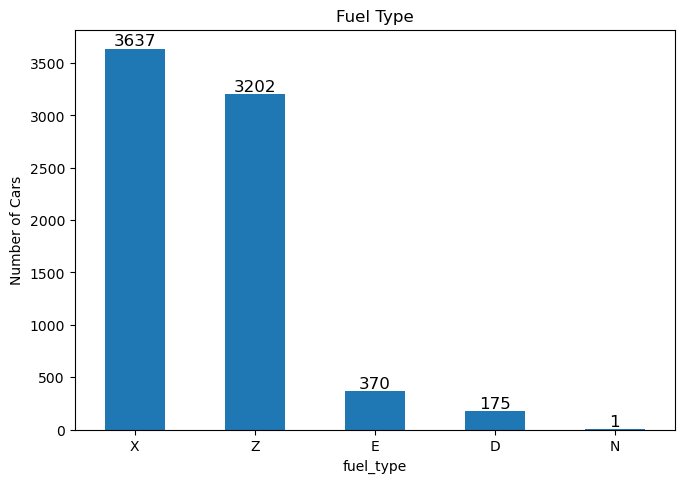

In [43]:
fig = plt.figure(figsize = (6,4))
ax = fig.add_axes([0,0,1,1])
counts = df["Fuel Type"].value_counts().sort_values(ascending=False).head(20)
counts.plot(kind = "bar")
plt.title('Fuel Type')   
plt.xlabel('fuel_type') 
plt.ylabel('Number of Cars')
plt.xticks(rotation = 0)
ax.bar_label(ax.containers[0], labels=counts.values, fontsize=12);

In [44]:
df["Fuel Consumption City (L/100 km)"].nunique()

211

In [45]:
df["Fuel Consumption Hwy (L/100 km)"].nunique()

143

In [46]:
df["Fuel Consumption Comb (L/100 km)"].nunique()

181

In [47]:
df["Fuel Consumption Comb (mpg)"].nunique()

54

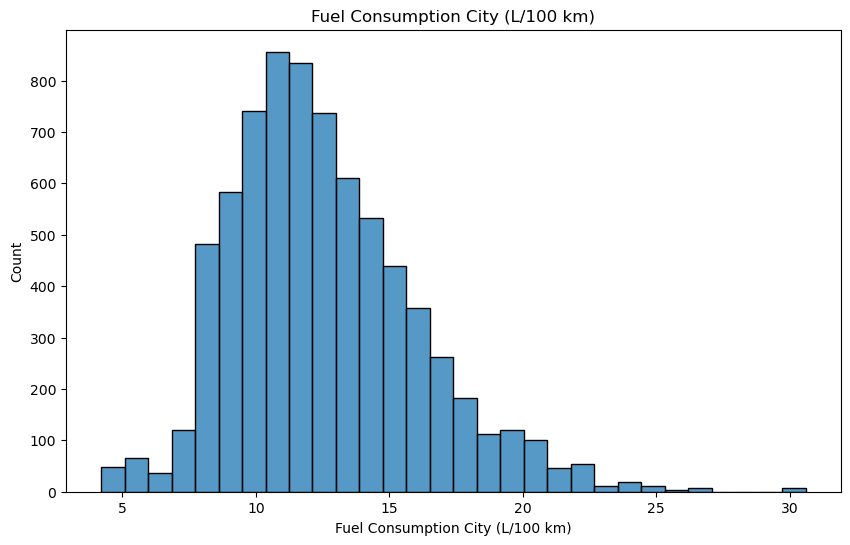

In [48]:
sns.histplot(data=df, x="Fuel Consumption City (L/100 km)", bins=30)
plt.title('Fuel Consumption City (L/100 km)');

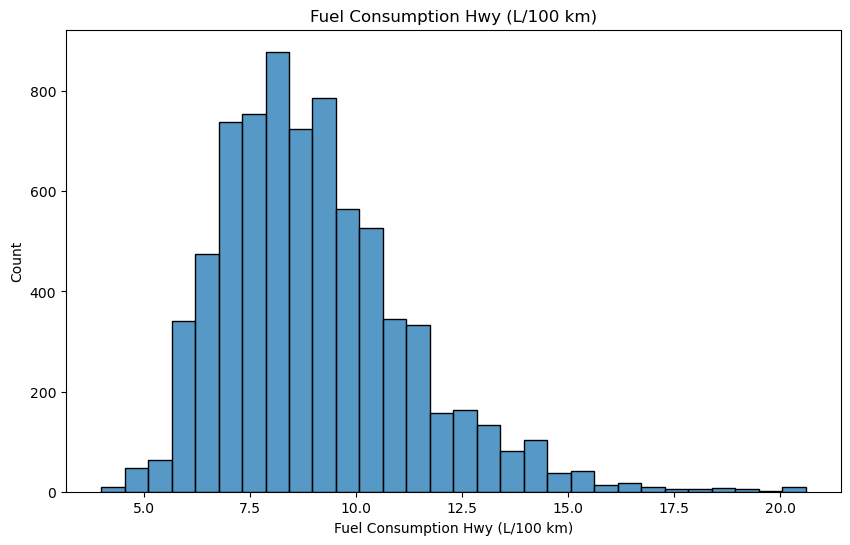

In [49]:
sns.histplot(data=df, x='Fuel Consumption Hwy (L/100 km)', bins=30)
plt.title('Fuel Consumption Hwy (L/100 km)');

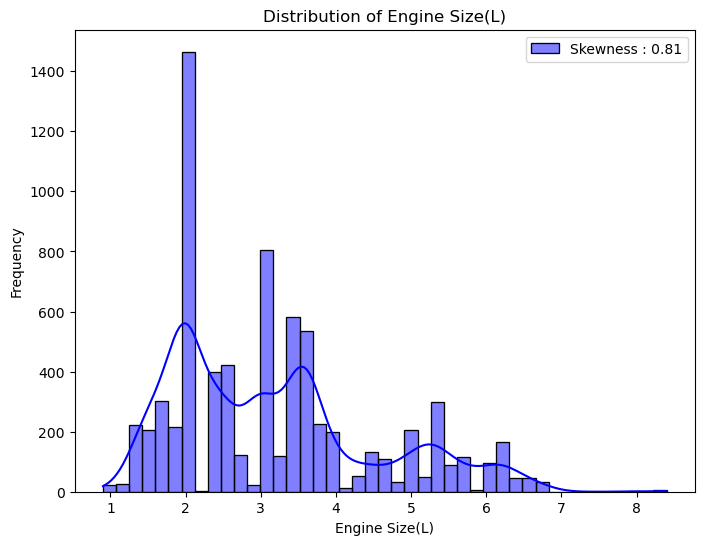

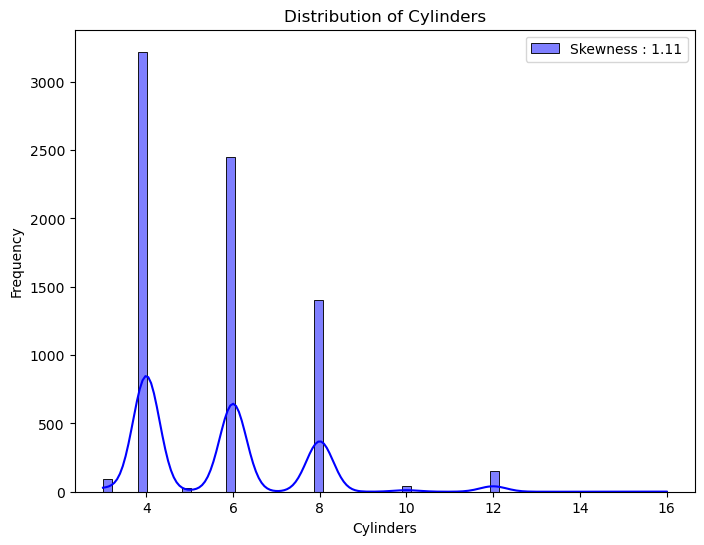

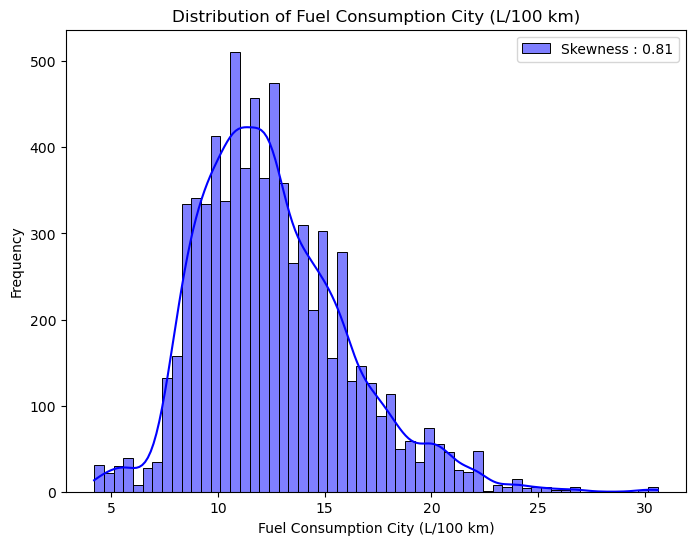

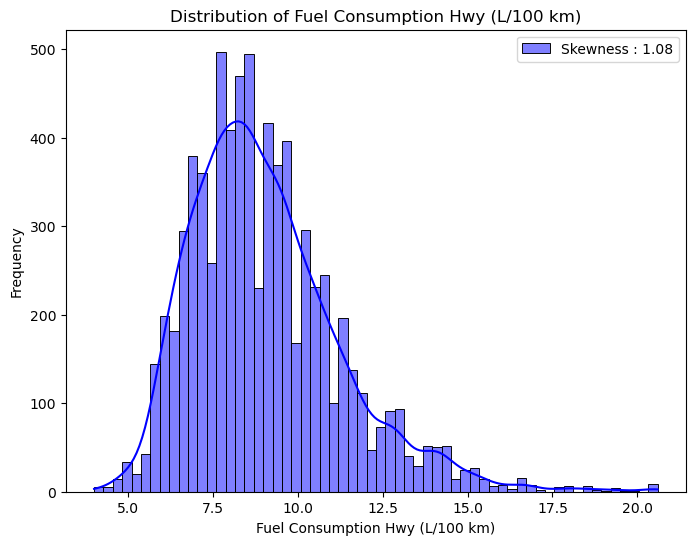

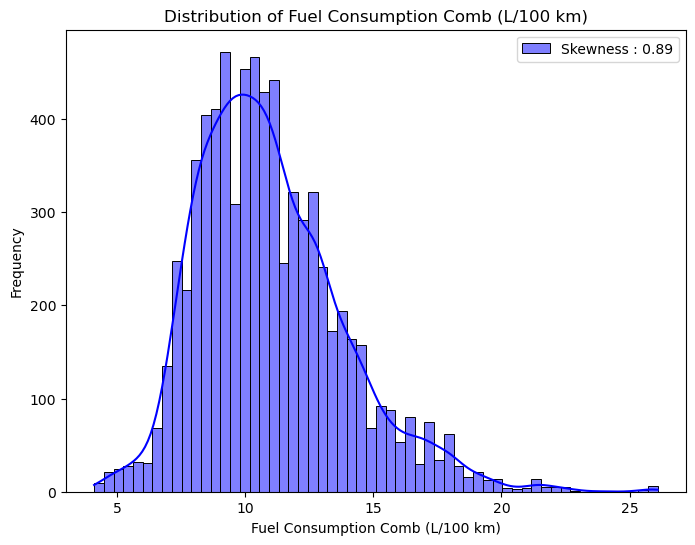

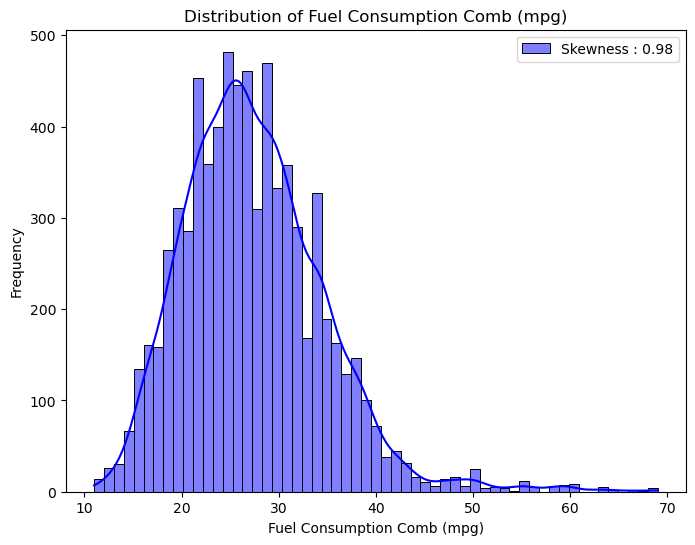

In [50]:
df_filtered = df.drop(columns="CO2 Emissions(g/km)")

numeric_cols = df_filtered.select_dtypes(include=['number']).columns

for col in numeric_cols:
    
    plt.figure(figsize=(8, 6))  
    g = sns.histplot(df_filtered[col], color="b", kde=True, label=f"Skewness : {df_filtered[col].skew():.2f}")
    
    plt.legend(loc="best")
    plt.title(f"Distribution of {col}")
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

In [13]:
df_filtered = df.drop(columns="CO2 Emissions(g/km)")

numeric_cols = df_filtered.select_dtypes(include=['number']).columns

for col_name in numeric_cols:
    
    column_skewness = skew(df_filtered[col_name].dropna())
    print(f"{col_name}: {column_skewness}")


Engine Size(L): 0.8090166237091084
Cylinders: 1.1101898640440213
Fuel Consumption City (L/100 km): 0.8088403827811873
Fuel Consumption Hwy (L/100 km): 1.078997475325438
Fuel Consumption Comb (L/100 km): 0.8931342662031229
Fuel Consumption Comb (mpg): 0.9768356000735062


<Axes: xlabel='Fuel Type', ylabel='CO2 Emissions(g/km)'>

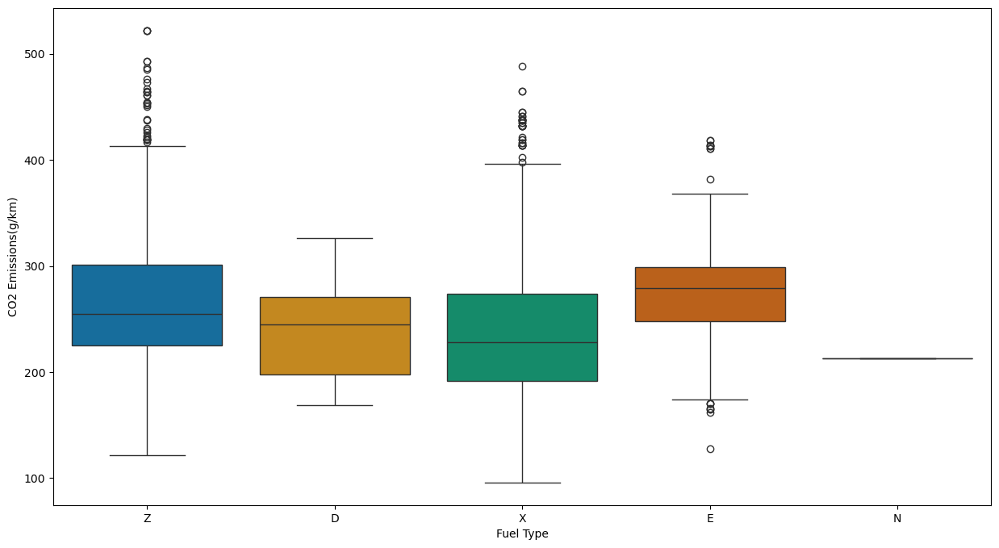

In [52]:
plt.figure(figsize = (15,8))
sns.boxplot(x="Fuel Type", y="CO2 Emissions(g/km)", data=df, palette="colorblind" )

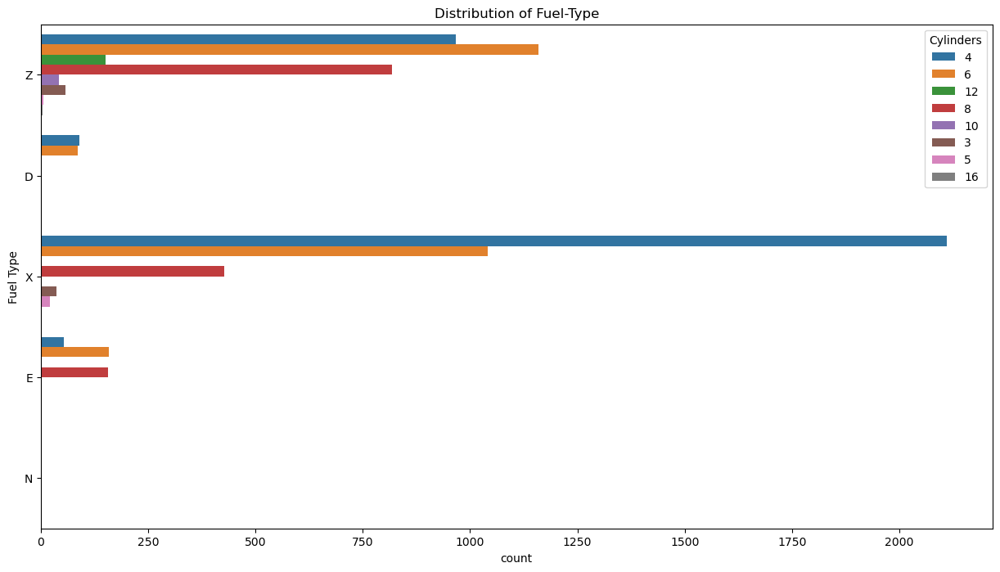

In [53]:
plt.figure(figsize = (15,8))

df['Cylinders'] = df['Cylinders'].astype(str)
sns.countplot(y="Fuel Type", data=df, hue='Cylinders')
plt.title('Distribution of Fuel-Type');

## <font color='blue'> <b>CO2 Emissions</b><font color='black'>

In [54]:
df[df['CO2 Emissions(g/km)']== df['CO2 Emissions(g/km)'].min()]

,Make,Model,Vehicle Class,Engine Size(L),Cylinders,Transmission,Fuel Type,Fuel Consumption City (L/100 km),Fuel Consumption Hwy (L/100 km),Fuel Consumption Comb (L/100 km),Fuel Consumption Comb (mpg),CO2 Emissions(g/km)
3824,HYUNDAI,IONIQ BLUE,FULL-SIZE,1.6,4,AM6,X,4.2,4.0,4.1,69,96
4900,HYUNDAI,IONIQ BLUE,FULL-SIZE,1.6,4,AM6,X,4.2,4.0,4.1,69,96
5931,HYUNDAI,IONIQ Blue,FULL-SIZE,1.6,4,AM6,X,4.2,4.0,4.1,69,96
6950,HYUNDAI,IONIQ Blue,FULL-SIZE,1.6,4,AM6,X,4.2,4.0,4.1,69,96


In [55]:
df.columns

Index(['Make', 'Model', 'Vehicle Class', 'Engine Size(L)', 'Cylinders',
       'Transmission', 'Fuel Type', 'Fuel Consumption City (L/100 km)',
       'Fuel Consumption Hwy (L/100 km)', 'Fuel Consumption Comb (L/100 km)',
       'Fuel Consumption Comb (mpg)', 'CO2 Emissions(g/km)'],
      dtype='object')

In [56]:
df[df['CO2 Emissions(g/km)']== df['CO2 Emissions(g/km)'].max()]

,Make,Model,Vehicle Class,Engine Size(L),Cylinders,Transmission,Fuel Type,Fuel Consumption City (L/100 km),Fuel Consumption Hwy (L/100 km),Fuel Consumption Comb (L/100 km),Fuel Consumption Comb (mpg),CO2 Emissions(g/km)
4509,BUGATTI,CHIRON,TWO-SEATER,8.0,16,AM7,Z,26.8,16.6,22.2,13,522
5575,BUGATTI,Chiron,TWO-SEATER,8.0,16,AM7,Z,26.8,16.6,22.2,13,522
6640,BUGATTI,Chiron,TWO-SEATER,8.0,16,AM7,Z,26.8,16.6,22.2,13,522


In [57]:
corr=df.corr(numeric_only=True)

In [58]:
def color_correlation1(val):
    """
    Takes a scalar and returns a string with
    the css property in a variety of color scales 
    for different correlations.
    """
    if val >= 0.6 and val < 0.99999 or val <= -0.6 and val > -0.99999:
        color = 'red'
    elif val < 0.6 and val >= 0.3 or val > -0.6 and val <= -0.3:
        color = 'blue'
    elif val == 1:
        color = 'green'    
    else:
        color = 'black'
    return 'color: %s' % color

numeric_df = df.select_dtypes(include=[np.number])
# Sayısal DataFrame üzerinde korelasyon hesapla ve stillendir
numeric_df.corr().style.applymap(color_correlation1)



,Engine Size(L),Fuel Consumption City (L/100 km),Fuel Consumption Hwy (L/100 km),Fuel Consumption Comb (L/100 km),Fuel Consumption Comb (mpg),CO2 Emissions(g/km)
Engine Size(L),1.000000,0.831379,0.761526,0.817060,-0.757854,0.851145
Fuel Consumption City (L/100 km),0.831379,1.000000,0.948180,0.993810,-0.927059,0.919592
Fuel Consumption Hwy (L/100 km),0.761526,0.948180,1.000000,0.977299,-0.890638,0.883536
Fuel Consumption Comb (L/100 km),0.817060,0.993810,0.977299,1.000000,-0.925576,0.918052
Fuel Consumption Comb (mpg),-0.757854,-0.927059,-0.890638,-0.925576,1.000000,-0.907426
CO2 Emissions(g/km),0.851145,0.919592,0.883536,0.918052,-0.907426,1.000000


In [59]:
def color_red(val):
    if val > 0.90 and val < 0.99:
        color = 'red'
    elif val>=1:
        color = "yellowgreen"
    else:
        color = 'white'
    return f'background-color: {color}'
pd.DataFrame.corr(corr).style.applymap(color_red)

,Engine Size(L),Fuel Consumption City (L/100 km),Fuel Consumption Hwy (L/100 km),Fuel Consumption Comb (L/100 km),Fuel Consumption Comb (mpg),CO2 Emissions(g/km)
Engine Size(L),1.000000,0.981666,0.972547,0.978973,-0.980901,0.987744
Fuel Consumption City (L/100 km),0.981666,1.000000,0.998338,0.999813,-0.999549,0.996457
Fuel Consumption Hwy (L/100 km),0.972547,0.998338,1.000000,0.999265,-0.998053,0.992827
Fuel Consumption Comb (L/100 km),0.978973,0.999813,0.999265,1.000000,-0.999419,0.995611
Fuel Consumption Comb (mpg),-0.980901,-0.999549,-0.998053,-0.999419,1.000000,-0.997940
CO2 Emissions(g/km),0.987744,0.996457,0.992827,0.995611,-0.997940,1.000000


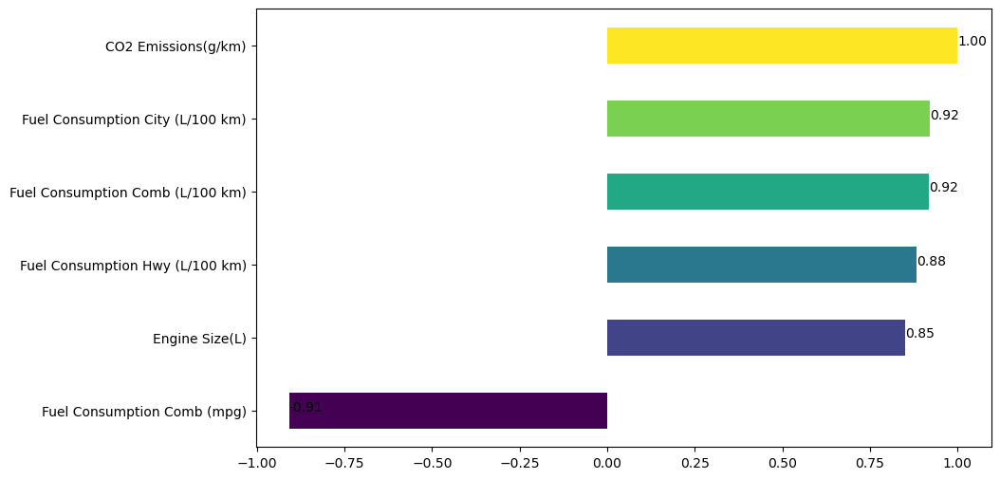

In [116]:
corr_values = numeric_df.corr()["CO2 Emissions(g/km)"].sort_values()
colors = plt.cm.viridis(np.linspace(0, 1, len(corr_values)))

ax = corr_values.plot.barh(color=colors)
for index, value in enumerate(corr_values):
    plt.text(value, index, "{:.2f}".format(value))

plt.show()

## "Conclusion in Exploratory Data Analysis (EDA)"

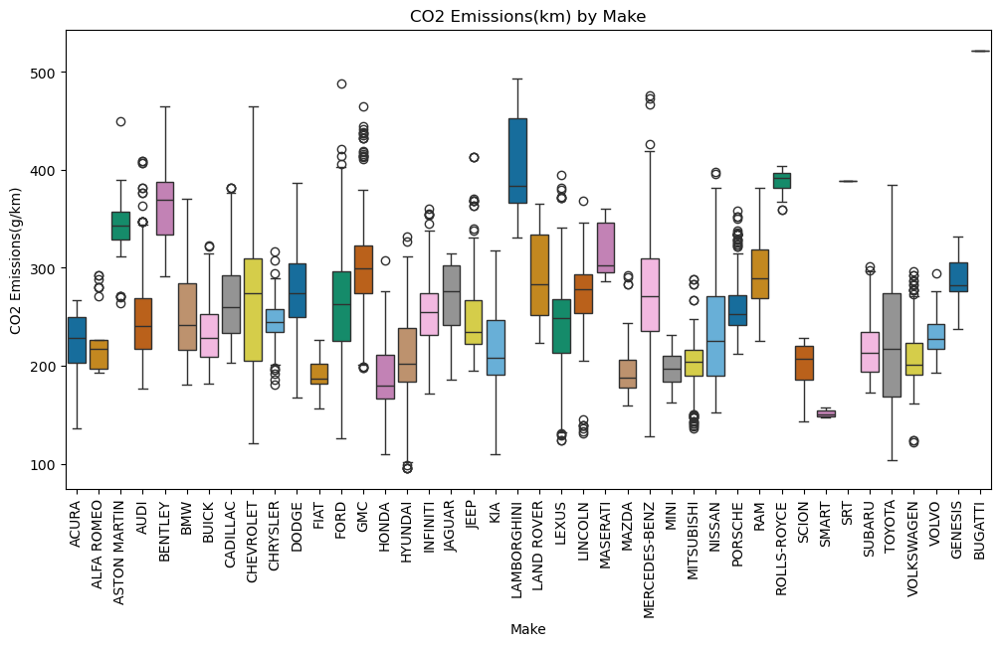

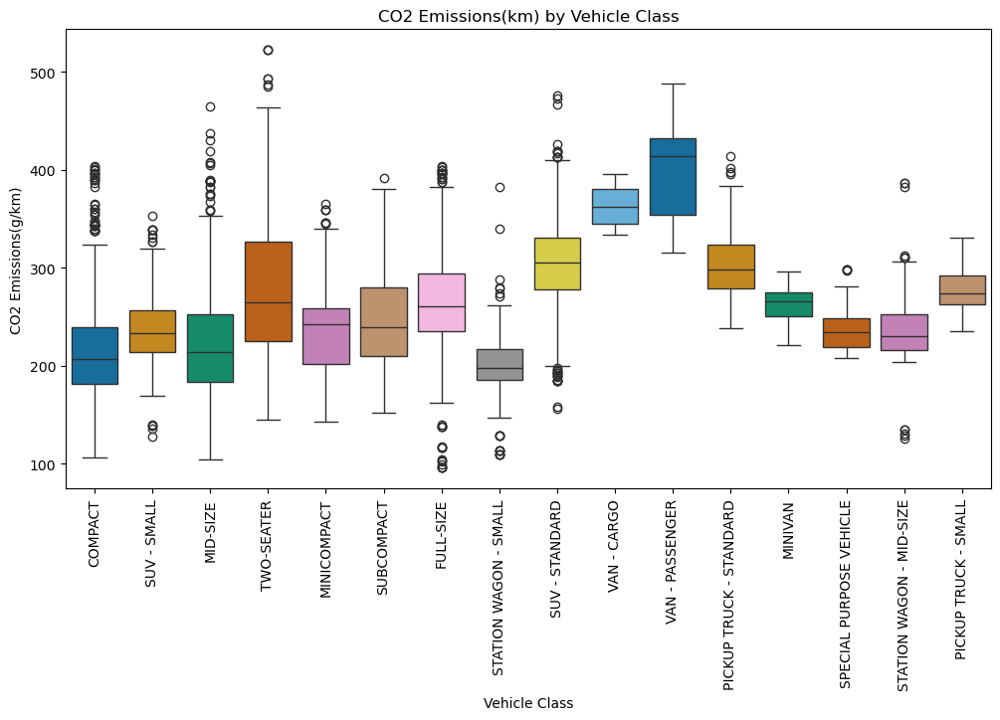

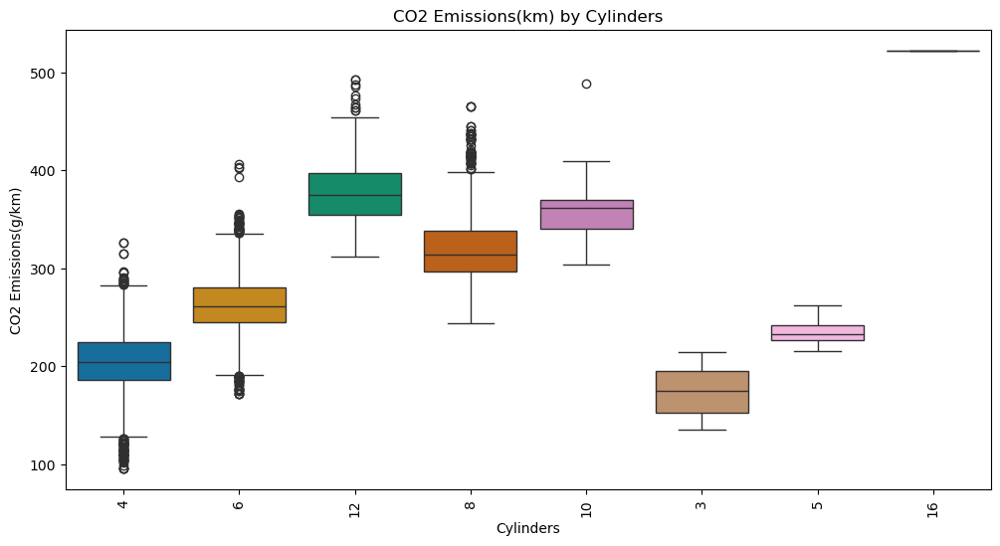

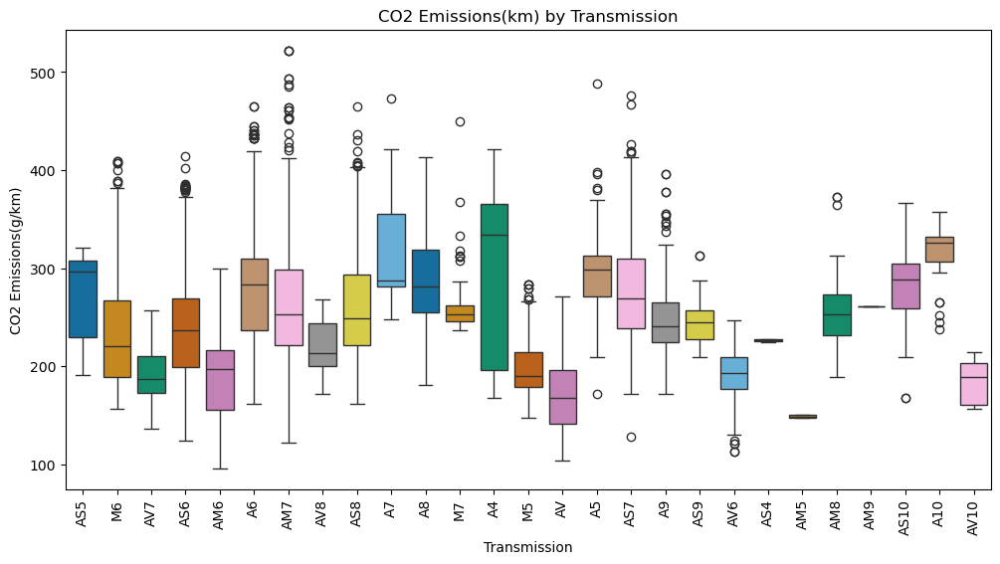

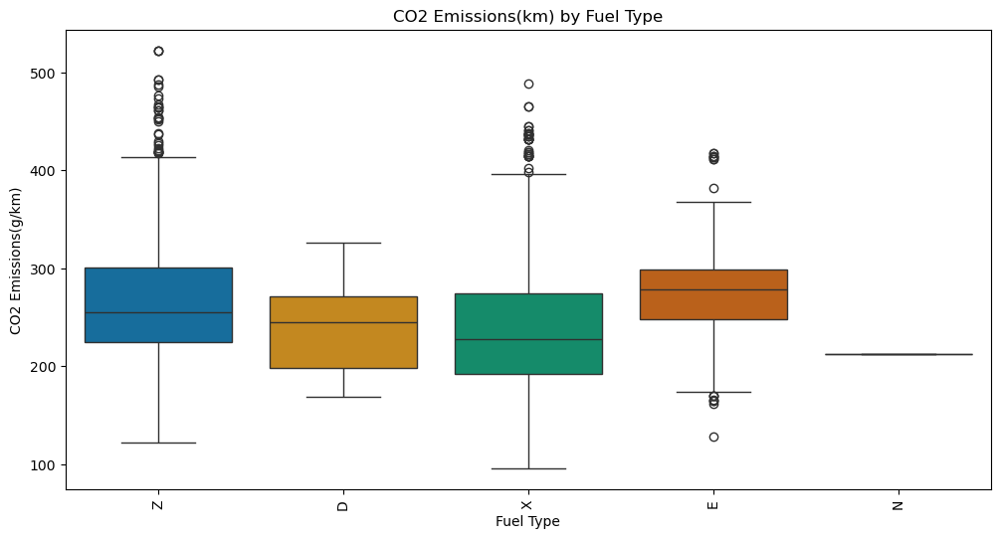

In [105]:
# Exclude "CO2 Emissions(g/km)" and numeric columns for x-axis plots
exclude_columns = ['CO2 Emissions(g/km)'] + df.select_dtypes(include=['number']).columns.tolist()

# Optionally, you might want to limit the number of unique values for categorical plots
max_unique_values =  2000

for col in df.columns:
    # Skip over the excluded columns and columns with too many unique values
    if col not in exclude_columns and df[col].nunique() <= max_unique_values:
        plt.figure(figsize=(12, 6))
        sns.boxplot(x=col, y="CO2 Emissions(g/km)", data=df, palette="colorblind")
        
        plt.title(f"CO2 Emissions(km) by {col}")
        plt.xticks(rotation=90)  # Rotate x-axis labels for better readability
        plt.show()

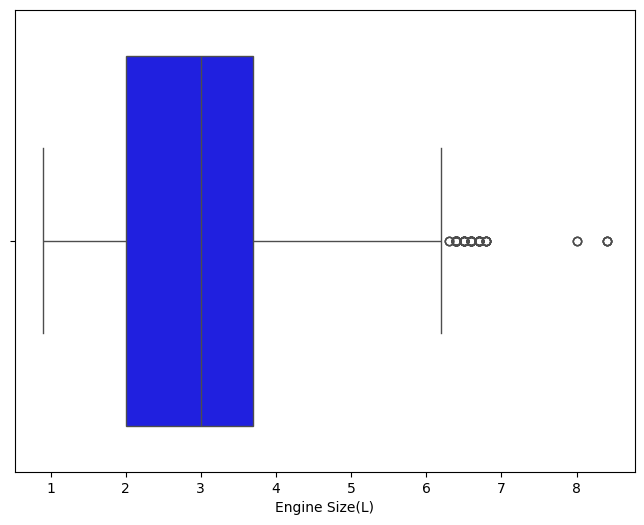

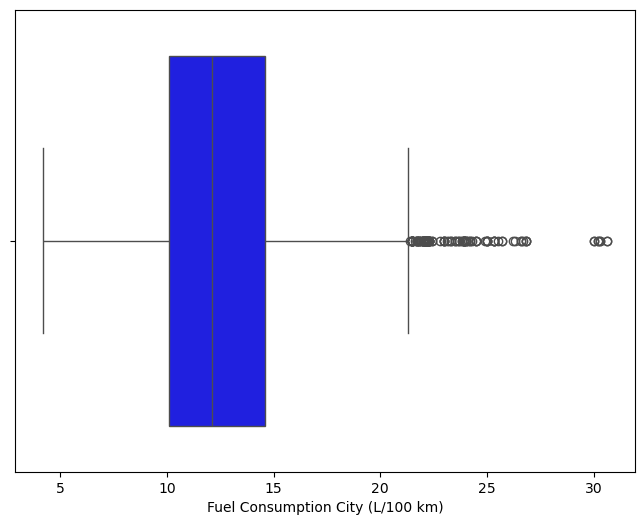

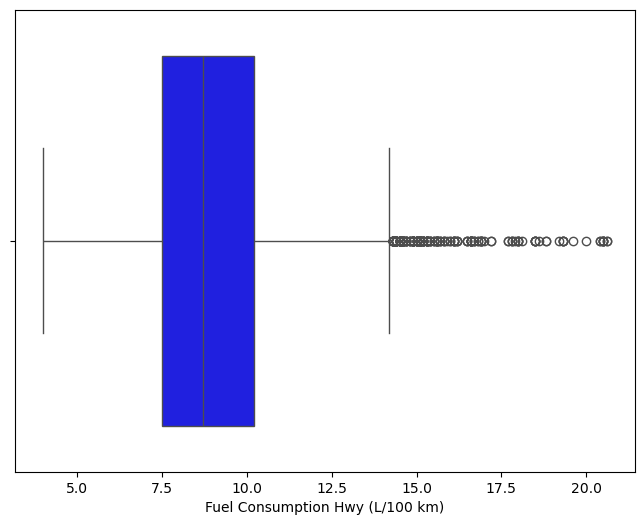

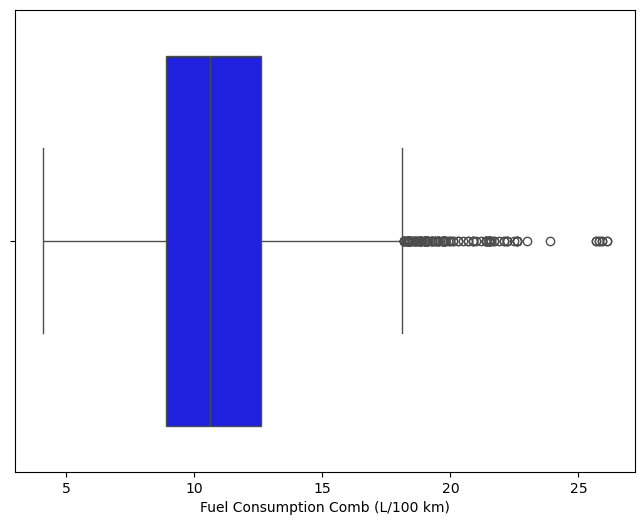

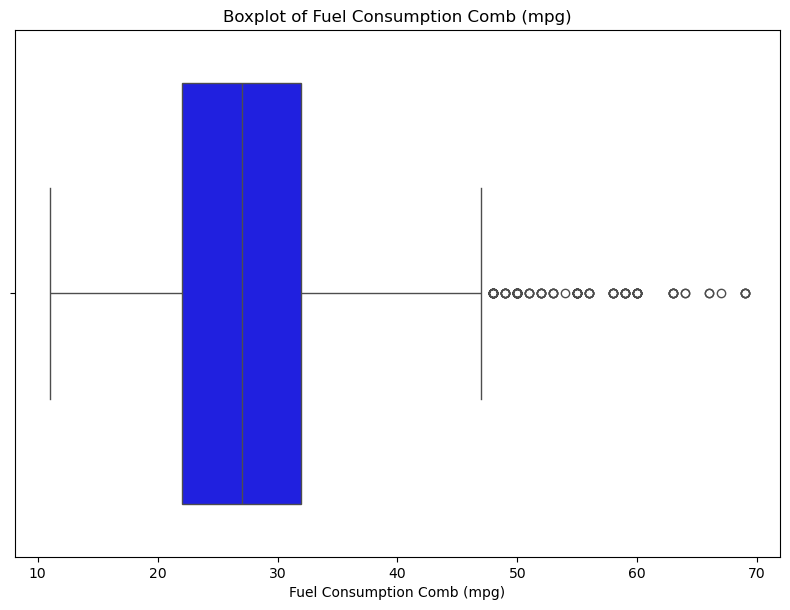

In [117]:
df_filtered = df.drop(columns="CO2 Emissions(g/km)")


# Assuming df_filtered is your DataFrame after dropping "CO2 Emissions(g/km)"
numeric_cols = df_filtered.select_dtypes(include=['number']).columns
for col in numeric_cols:
    plt.figure(figsize=(8, 6))
    sns.boxplot(x=df_filtered[col], color="b")
    
plt.tight_layout()
plt.title(f"Boxplot of {col}")
plt.xlabel(col)
plt.show()


In [68]:
for column in df.columns:
    unique_values = df[column].unique()
    unique_count = len(unique_values)

#\033[1m metni kalın yapar.
#\033[91m kırmızı rengi tanımlar.
#\033[94m mavi rengi tanımlar.
#\033[0m tüm stil ayarlarını (renk, kalın vs.) sıfırlar.
#033[92m mavi rengi tanımlar.
#\033[95m: Açık mor (violet) rengi tanımlar.
# Note: For columns with a large number of unique values, printing all values might not be practical.
    # Therefore, if there are more than 10 unique values, only the first 10 are displayed.
   
    print(f"\033[1m\033[91mColumn:\033[0m \033[1m\033[94m{column}\033[0m")
    print(f"\033[1m\033[92mNumber of Unique Values:\033[93m {unique_count}")
    
    if unique_count <= 10:
        print(f"\033[1mUnique Values:\033[0m {unique_values}\n")
    else:
        print(f"\033[95mFirst 10 Unique Values:\033[0m {unique_values[:10]}")
        print(f"... and {unique_count - 10} more unique values\n")


Column: Make
Number of Unique Values: 42
First 10 Unique Values: ['ACURA' 'ALFA ROMEO' 'ASTON MARTIN' 'AUDI' 'BENTLEY' 'BMW' 'BUICK'
 'CADILLAC' 'CHEVROLET' 'CHRYSLER']
... and 32 more unique values

Column: Model
Number of Unique Values: 2053
First 10 Unique Values: ['ILX' 'ILX HYBRID' 'MDX 4WD' 'RDX AWD' 'RLX' 'TL' 'TL AWD' 'TSX' '4C'
 'DB9']
... and 2043 more unique values

Column: Vehicle Class
Number of Unique Values: 16
First 10 Unique Values: ['COMPACT' 'SUV - SMALL' 'MID-SIZE' 'TWO-SEATER' 'MINICOMPACT'
 'SUBCOMPACT' 'FULL-SIZE' 'STATION WAGON - SMALL' 'SUV - STANDARD'
 'VAN - CARGO']
... and 6 more unique values

Column: Engine Size(L)
Number of Unique Values: 51
First 10 Unique Values: [2.  2.4 1.5 3.5 3.7 1.8 5.9 4.7 3.  4. ]
... and 41 more unique values

Column: Cylinders
Number of Unique Values: 8
Unique Values: ['4' '6' '12' '8' '10' '3' '5' '16']

Column: Transmission
Number of Unique Values: 27
First 10 Unique Values: ['AS5' 'M6' 'AV7' 'AS6' 'AM6' 'A6' 'AM7' 'AV8' 'AS8

In [14]:
import plotly.graph_objects as go

# Assuming df_filtered is your DataFrame after dropping "CO2 Emissions(g/km)"
numeric_cols = df_filtered.select_dtypes(include=['number']).columns

for col in numeric_cols:
    # Step 1: Binning the data with qcut and ensuring no duplicate bins
    df_filtered[f"{col}_bin"] = pd.qcut(df_filtered[col], q=4, duplicates='drop')
    
    # Convert Interval objects to strings for Plotly compatibility
    df_filtered[f"{col}_bin_str"] = df_filtered[f"{col}_bin"].astype(str)
    
    # Step 2: Calculating proportions
    bin_counts = df_filtered[f"{col}_bin_str"].value_counts(normalize=True)
    
    # Step 3: Plotting with Plotly
    fig = go.Figure(data=[go.Pie(labels=bin_counts.index, values=bin_counts.values, title=f"Distribution of {col}")])
    
    fig.update_traces(textposition='inside', textinfo='percent+label')
    fig.show()

In [82]:
pip install seaborn --upgrade

Note: you may need to restart the kernel to use updated packages.


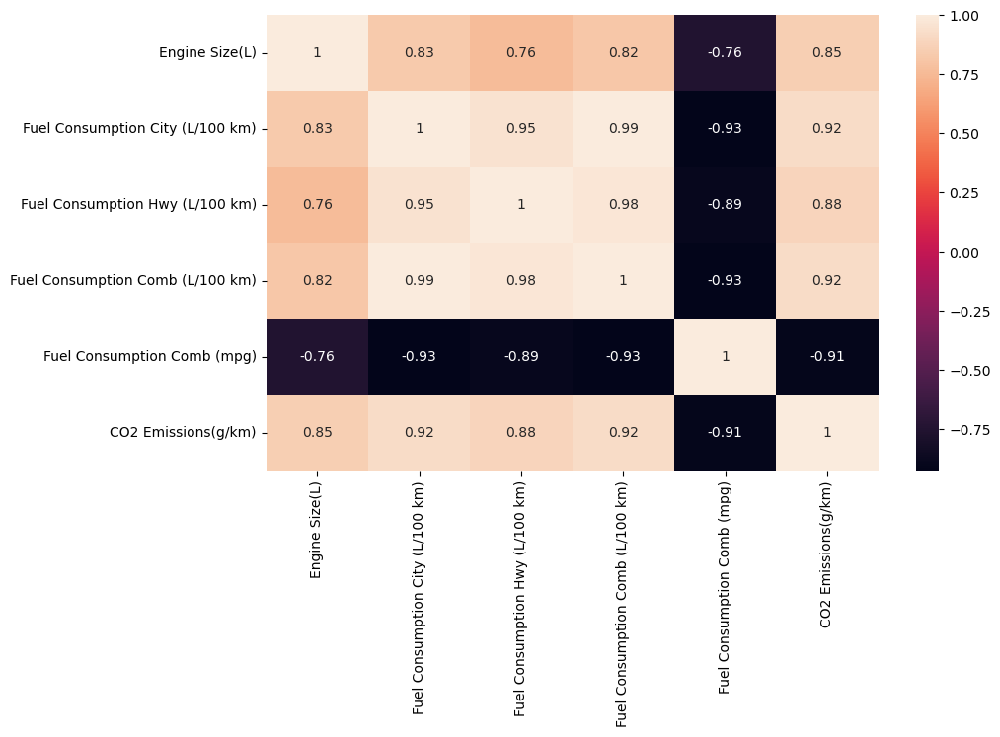

In [83]:

sns.heatmap(df.corr(numeric_only=True), annot=True);

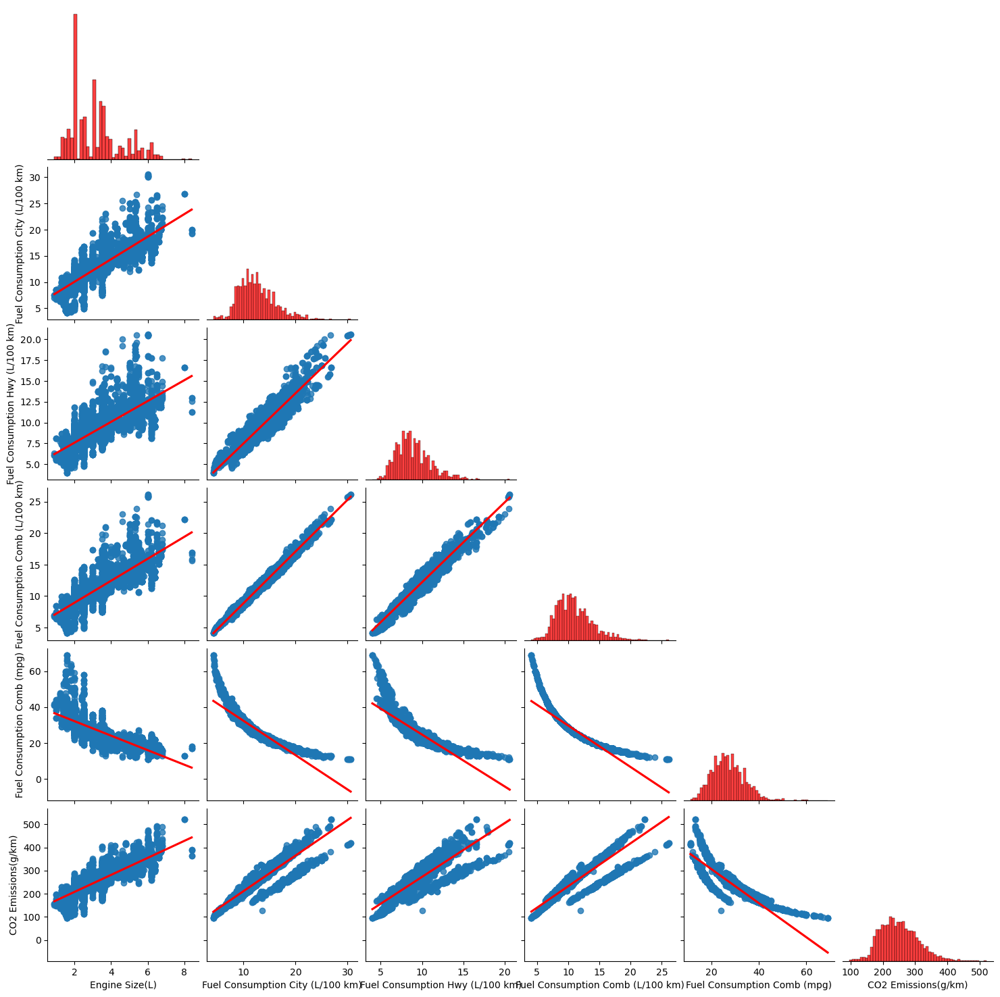

In [95]:
sns.pairplot(df, kind = "reg", diag_kind = "hist", diag_kws={"color":"red"}, plot_kws={"line_kws":{"color":"red"}},
             corner=True)

plt.show()

Since each of these values is close to +1, we can say that the distributions are slightly to moderately right-skewed. This may necessitate the application of some data transformations or normalization techniques during the data analysis and modeling process.

In [23]:
!pip install summarytools

  Using cached summarytools-0.2.3-py3-none-any.whl


In [24]:
from summarytools import dfSummary
dfSummary(df)

No,Variable,Stats / Values,Freqs / (% of Valid),Graph,Missing
1,Make[object],1. FORD2. CHEVROLET3. BMW4. MERCEDES-BENZ5. PORSCHE6. TOYOTA7. GMC8. AUDI9. NISSAN10. JEEP11. other,"628 (8.5%)588 (8.0%)527 (7.1%)419 (5.7%)376 (5.1%)330 (4.5%)328 (4.4%)286 (3.9%)259 (3.5%)251 (3.4%)3,393 (45.9%)","<img src = ""data:image/png;base64, iVBORw0KGgoAAAANSUhEUgAAAJsAAAD+CAYAAAAtWHdlAAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjcuMiwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy8pXeV/AAAACXBIWXMAAA9hAAAPYQGoP6dpAAAEIklEQVR4nO3dTWobWQBG0VIjQmciYQxejBfRi+1FaDfGWINOyEQ90KTB+qmSnm7Afc44AhEuT1TxvmR1OBwmKPzxu78A/x9iIyM2MmIjIzYyYiMjNjJiIyM2Mqtpmr5P0/Rt4ed+HQ6HHw/4Pnxh6+fn5782m83Tkg/t9/v31Wr1t+BYYr3ZbJ5eX19/bLfbn3M+8PHx8edut3t6e3v7Nk2T2JhtPU3TtN1uf768vPyz4HPfH/R9+MI8IJARGxmxkREbGbGRERsZsZERGxmxkREbGbGRERsZsZERG5n1NB3vqM39wJI/C/+13u/377vd7mlacEdtv9+/T9P063Ffi6/IBoHMyj+ZReWWk82pxk0Wr6ssq7jVonWVZRX3uGVdZVnFTbzUJSM2MmIjIzYyYiMjNjJiIyM2MmIjIzYyYiMjNjJiI7No8GLswj0WD16MXbiVa+FkDF7ILD3ZnGrcbNHgxdiFe8wevBi7cK+lgxdjF27mpS4ZsZERGxmxkREbGbGRERsZsZERGxmxkREbGbGRERuZ2YMXYxfutWjwYuzCPVwLJ2PwQsYDApm5P6N+PrnbrHWVVRUjXF1XWVUxytx1lVUVd/OAQEZsZMRGRmxkxEZGbGTERkZsZMRGRmxkxEZGbGTERubqusqqilFmrausqhjBtXAy1lVk5pxsTjWGuDp4MXZhlIuDF2MXRpozeDF2YQgvdcmIjYzYyIiNjNjIiI2M2MiIjYzYyIiNjNjIiI2M2MhcHLwYuzDS1cGLsQujuBZOxuCFzLWTzanGMBcHL8YujHR28GLswmjXBi/GLgzjpS4ZsZERGxmxkREbGbGRERsZsZERGxmxkREbGbGRERsZsZE5u66yrGK0i+sqyypGskEgY11FxslGxrqKjHUVGesqMl7qkhEbGbGRERsZsZERGxmxkREbGbGRERsZsZERGxmxkTF4IWPwQsa1cDIGL2QunWxONYY6O3gxdmG0k4MXYxce4dLgxdiFobzUJSM2MmIjIzYyYiMjNjJiIyM2MmIjIzYyYiMjNjJiI3Ny8GLswiOcHbwYuzCaa+FkDF7IeEAgc+5n1E8ow51cV1lW8Qif1lWWVTzKuXWVZRXDeUAgIzYyYiMjNjJiIyM2MmIjIzYyYiMjNjJiIyM2MmIj82ldZVnFo5xcV1lW8QiuhZOxriLjZCNj8ELG4IWMwQsZL3XJiI2M2MiIjYzYyIiNjNjIiI2M2MiIjYzYyIiNjNjIGLyQMXgh41o4GYMXMpf+ozSc8EOdHLxwZPgz1qfBC0eGP+OdG7xwZPgzkJe6ZMRGRmxkxEZGbGTERkZsZMRGRmxkxEZGbGTERkZsZD4NXjjydzLeycELR4Y/Y7kWfplr4QMZvJDxgEBGbGTERkZsZMRGRmxkxEZGbGTERuZfPL1O4seIfYQAAAAASUVORK5CYII="">",0(0.0%)
2,Model[object],1. F-150 FFV 4X42. F-150 FFV3. MUSTANG4. FOCUS FFV5. SONIC6. SONIC 57. F-150 4X48. F-1509. ACCORD10. COMPASS11. other,"32 (0.4%)32 (0.4%)27 (0.4%)24 (0.3%)20 (0.3%)20 (0.3%)20 (0.3%)20 (0.3%)19 (0.3%)19 (0.3%)7,152 (96.8%)","<img src = ""data:image/png;base64, iVBORw0KGgoAAAANSUhEUgAAAJsAAAD+CAYAAAAtWHdlAAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjcuMiwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy8pXeV/AAAACXBIWXMAAA9hAAAPYQGoP6dpAAADo0lEQVR4nO3cQWojVxhG0b+McNqTEkLgJSR78CJ6sb0ILSJ7MMY1iDueKIMEYtKdSaBvgXLOyGj0Bhc9SdTn5Xq9DhTu9j4A/x9iIyM2MmIjIzYyYiMjNjJiIyM2MsvMPMzMXK/Xt53Pwo07nM/nzzMzy7J8ERw/0t26rqd1XU8zc7/3YbhtPrORERsZsZERGxmxkREbGbGRERsZsZERGxmxkREbGbGRERsZsZERG5nDtm0vf/39vutJuHk2CGQW/zKLinc2MtZVZKyryPjpg4zYyIiNjNjIiI2M2MiIjYzYyIiNjNjIiI2M2MiIjYzYyIiNjMELGY+FkzF4IeOdjYzBCxmDFzJ++iAjNjJiIyM2MmIjIzYyYiMjNjJiIyM2MmIjIzYyYiMjNjJiI2PwQsZj4WQMXsj4zEbGNUrGuoqMdRUZn9nIiI2M2MiIjYzYyIiNjNjIiI2M2MiIjYzYyIiNjNjIiI2M2MhYV5HxWDgZ6yoyPrORuVuW5ZdlWT7tfRBu393M/DwzP+19EG6fa5SM2MiIjYzYyIiNjNjIiI2M2MiIjYzYyIiNjNjIiI2M2MiIjczdzPw6M7/vfRBunw0CGdcoGbGRMXghY/BCxjVKRmxkxEZGbGTERkZsZMRGRmxkxEZGbGTERkZsZMRGRmxkxEZGbGSsq8hYV5FxjZIRGxnrKjLWVWRco2TERkZsZMRGRmxkxEZGbGTERkZsZMRGRmxkxEZGbGTERkZsZAxeyBi8kHGNkhEbGYMXMgYvZFyjZMRGRmxkxEZGbGTERkZsZMRGRmxkxEZGbGTERkZsZMRGRmxkDF7IGLyQcY2SERsZsZGxriJjXUXGNUpGbGTERkZsZMRGRmxkxEZGbGTERkZsZMRGRmxkxEZGbGTERsa6iox1FRnXKBmxkTF4IWPwQsY1SkZsZMRGRmxkxEZGbGTERkZsZMRGRmxkxEZGbGTERkZsZMRGxuCFjMELGdcomWVmHmbmfu+DcHPer9fr28cXDufz+fO6rqe9TsRt2rbtZVmWLx+DO6zrenp6eno7Ho9f9zwct+P19fXT5XI5PT8/38/M37HNzByPx6+Pj4+/7XY6btHDP1/wBYGM2MiIjYzYyIiNjNjIiI2M2MiIjYzYyIiNjNjIiI3MYebPR0L2Pgi34996Omzb9nK5XE7znUdC4L/atu1lZt4/vuaxcH6Ubx4Lt64i4wsCGbGRERsZsZERGxmxkREbGbGRERuZPwC/n67sAVvbuQAAAABJRU5ErkJggg=="">",0(0.0%)
3,Vehicle Class[object],1. SUV - SMALL2. MID-SIZE3. COMPACT4. SUV - STANDARD5. FULL-SIZE6. SUBCOMPACT7. PICKUP TRUCK - STANDARD8. TWO-SEATER9. MINICOMPACT10. STATION WAGON - SMALL11. other,"1,217 (16.5%)1,133 (15.3%)1,022 (13.8%)735 (10.0%)639 (8.7%)606 (8.2%)538 (7.3%)460 (6.2%)326 (4.4%)252 (3.4%)457 (6.2%)","<img s

In [25]:
!pip install ydata-profiling
    

  Obtaining dependency information for ydata-profiling from https://files.pythonhosted.org/packages/a2/19/c58a6c22a04806c70802518eaf70866e5633fe47e671ded361295dfaf839/ydata_profiling-4.6.4-py2.py3-none-any.whl.metadata
  Using cached ydata_profiling-4.6.4-py2.py3-none-any.whl.metadata (20 kB)
  Obtaining dependency information for pydantic>=2 from https://files.pythonhosted.org/packages/db/dc/afecbd9650f486889181c6d1a0d675b580c06253ea7e304588e4c7485bdb/pydantic-2.6.1-py3-none-any.whl.metadata
  Using cached pydantic-2.6.1-py3-none-any.whl.metadata (83 kB)
  Using cached visions-0.7.5-py3-none-any.whl (102 kB)
  Using cached htmlmin-0.1.12-py3-none-any.whl
  Obtaining dependency information for phik<0.13,>=0.11.1 from https://files.pythonhosted.org/packages/95/e3/250ce99ed761389028543fcb876176ba619f6bf387d6cce3bab736bd92cc/phik-0.12.4-cp311-cp311-win_amd64.whl.metadata
  Using cached phik-0.12.4-cp311-cp311-win_amd64.whl.metadata (5.6 kB)
  Obtaining dependency information for multimeth

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
anaconda-cloud-auth 0.1.3 requires pydantic<2.0, but you have pydantic 2.6.1 which is incompatible.


In [26]:
from ydata_profiling import ProfileReport

In [27]:
pr_df = ProfileReport(df)
pr_df

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [18]:
df.columns

Index(['Make', 'Model', 'Vehicle Class', 'Engine Size(L)', 'Cylinders',
       'Transmission', 'Fuel Type', 'Fuel Consumption City (L/100 km)',
       'Fuel Consumption Hwy (L/100 km)', 'Fuel Consumption Comb (L/100 km)',
       'Fuel Consumption Comb (mpg)', 'CO2 Emissions(g/km)'],
      dtype='object')

# <font color='green'> <b>Simple Linear Regression Model</b><font color='black'>

In [22]:
df = df[["Engine Size(L)","CO2 Emissions(g/km)"]]
df.head()

,Engine Size(L),CO2 Emissions(g/km)
0,2.0,196
1,2.4,221
2,1.5,136
3,3.5,255
4,3.5,244


In [29]:
df.shape

(7385, 2)

In [ ]:
df.info()

<Axes: xlabel='Engine Size(L)', ylabel='CO2 Emissions(g/km)'>

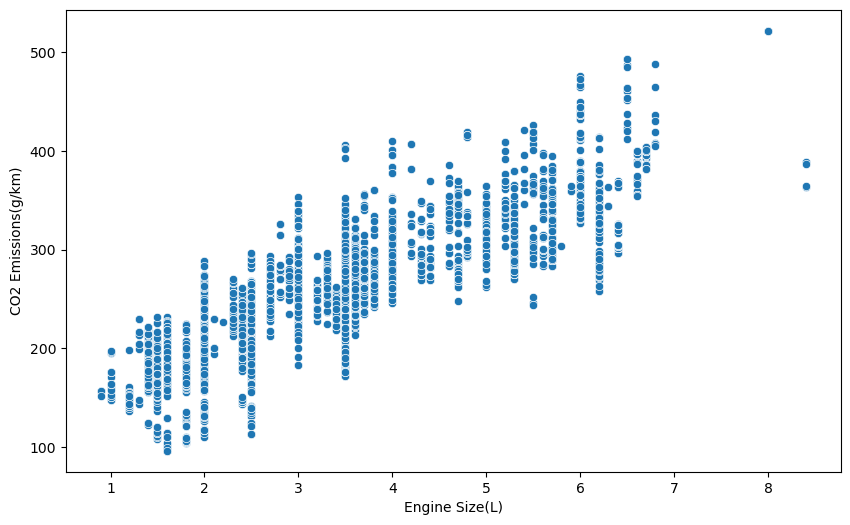

In [30]:
sns.scatterplot(x="Engine Size(L)", y = "CO2 Emissions(g/km)", data=df)

In [31]:
corr= df["CO2 Emissions(g/km)"].corr(df["Engine Size(L)"])
corr

0.8511446437900009

## Coefficant of determination (R2)

In [23]:
R2_score = corr**2 # R2 scoru ile "Engine Size(L)" bu feature la targetin sadece 72% aciklaya biliyoruz.
R2_score

0.7244472046524079

''

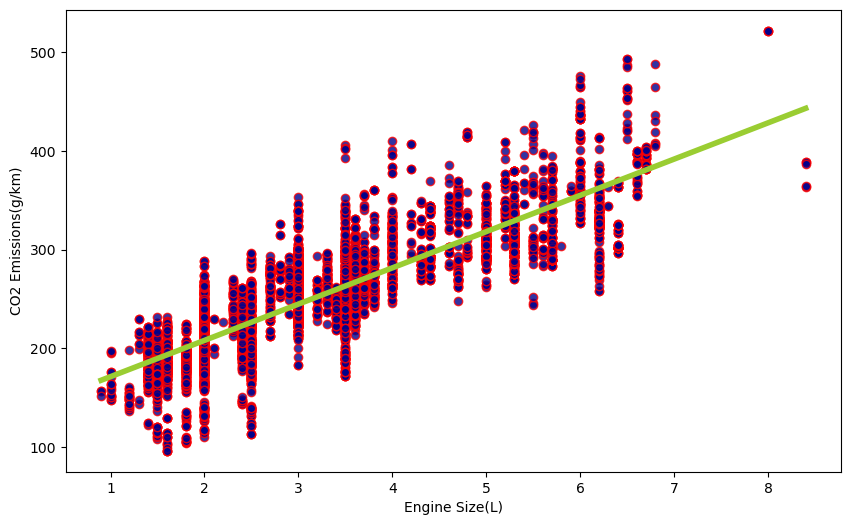

In [24]:
# Least square Error LSE ile Line of Best fit seçimi

sns.regplot( x ="Engine Size(L)" ,
            y= "CO2 Emissions(g/km)",
            data=df, 
            ci=None,
            line_kws={"color": "yellowgreen", "lw": 4},
  scatter_kws={"color": "darkblue", "edgecolor": "red"})
;

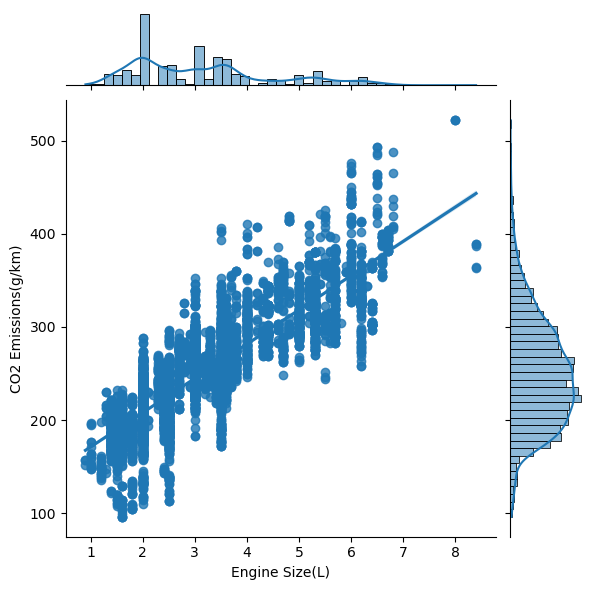

In [26]:
sns.jointplot(y=df["CO2 Emissions(g/km)"], x=df["Engine Size(L)"],  kind='reg');

## <font color='blue'> <b>Splitting the dataset into X (independent variables) and y (dependent variable)</b><font color='black'>

In [27]:
X = df["Engine Size(L)"]    # features  # DataFrame olarak kalacak şekilde çift köşeli parantez kullanıyoruz
y = df["CO2 Emissions(g/km)"]   # target variable
print(X,y)

0       2.0
1       2.4
2       1.5
3       3.5
4       3.5
       ... 
7380    2.0
7381    2.0
7382    2.0
7383    2.0
7384    2.0
Name: Engine Size(L), Length: 7385, dtype: float64 0       196
1       221
2       136
3       255
4       244
       ... 
7380    219
7381    232
7382    240
7383    232
7384    248
Name: CO2 Emissions(g/km), Length: 7385, dtype: int64


y_pred = b1X + b0

b1 =  x'in katsayısı

b0 = X sıfır iken y nin aldığı değer

In [35]:
np.polyfit(X, y, deg=1) 

array([ 36.77731519, 134.36589272])

In [36]:
slope, intercept = np.polyfit(X, y, deg=1)

In [37]:
print("slope       :", slope)
print("intercept   :", intercept)

slope       : 36.77731518641939
intercept   : 134.3658927234949


In [38]:
b1, b0 = np.polyfit(X, y, deg = 1)

In [39]:
print("b1 :", b1)
print("b0 :", b0)

b1 : 36.77731518641939
b0 : 134.3658927234949


In [40]:
# y_pred i formulize edelim
y_pred = b1*X + b0

In [41]:
y_pred

0       207.920523
1       222.631449
2       189.531866
3       263.086496
4       263.086496
           ...    
7380    207.920523
7381    207.920523
7382    207.920523
7383    207.920523
7384    207.920523
Name: Engine Size(L), Length: 7385, dtype: float64

In [42]:
values = {"actual": y, "predicted": y_pred, "residual": y - y_pred, "LSE": (y - y_pred)**2}
df_2 = pd.DataFrame(values)
df_2

,actual,predicted,residual,LSE
0,196,207.920523,-11.920523,142.098871
1,221,222.631449,-1.631449,2.661626
2,136,189.531866,-53.531866,2865.660624
3,255,263.086496,-8.086496,65.391416
4,244,263.086496,-19.086496,364.294325
...,...,...,...,...
7380,219,207.920523,11.079477,122.754808
7381,232,207.920523,24.079477,579.821208
7382,240,207.920523,32.079477,1029.092838
7383,232,207.920523,24.079477,579.821208


In [43]:
df_2.residual.sum().round()

0.0

In [44]:
df_2.LSE

0        142.098871
1          2.661626
2       2865.660624
3         65.391416
4        364.294325
           ...     
7380     122.754808
7381     579.821208
7382    1029.092838
7383     579.821208
7384    1606.364469
Name: LSE, Length: 7385, dtype: float64

In [45]:
df_2.LSE.sum()

6966208.685372684

# Prediction with simple linear regression

In [46]:
potential_eng_size= np.linspace(0,10,7385)   
potential_eng_size

array([0.00000000e+00, 1.35427952e-03, 2.70855905e-03, ...,
       9.99729144e+00, 9.99864572e+00, 1.00000000e+01])

In [47]:
predicted_co2 = b1*potential_eng_size + b0
predicted_co2

array([134.36589272, 134.41569949, 134.46550625, ..., 502.03943106,
       502.08923782, 502.13904459])

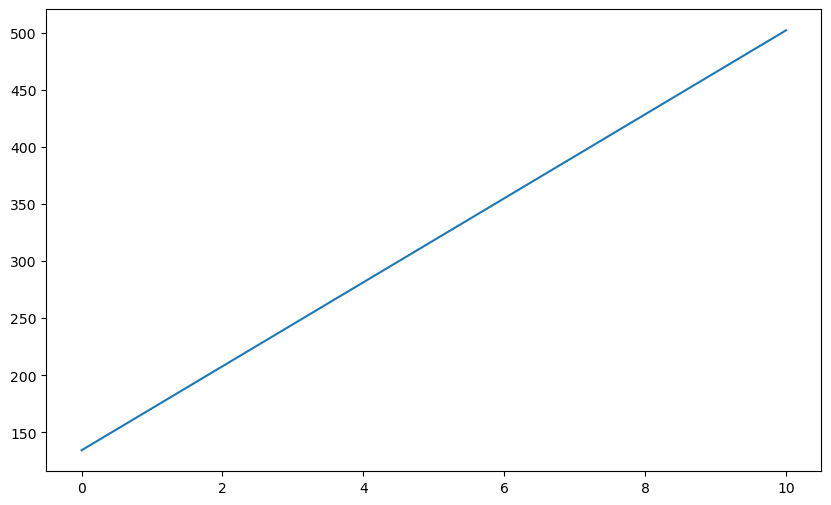

In [48]:
plt.plot(potential_eng_size,predicted_co2)

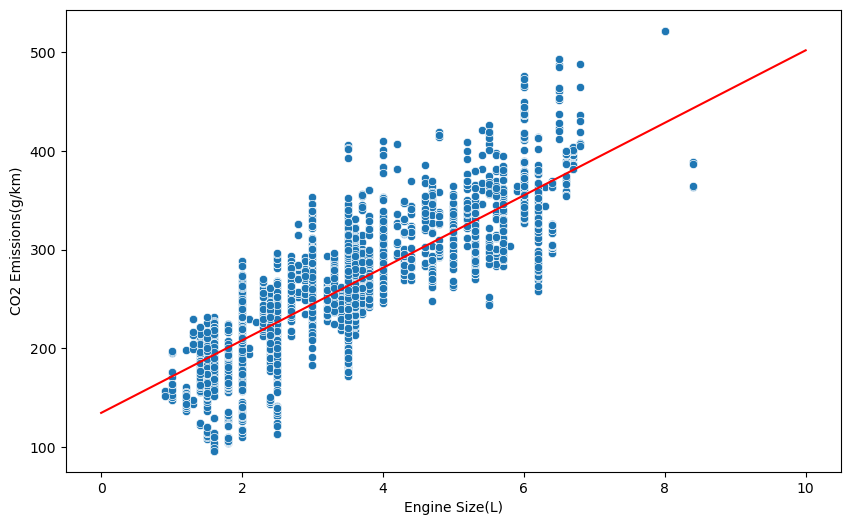

In [49]:
plt.plot(potential_eng_size, predicted_co2 , color ="r")
sns.scatterplot(x="Engine Size(L)", y="CO2 Emissions(g/km)", data=df);

# How can we improve our predictions? 

y = b1 * x + b0  => simple linear

y = a1 * x**3 + a2 * x**2 + a3*x + a0 => 3 degree polinominal
Model Complexity

In [50]:
a = np.polyfit(X, y, deg=3)
a

array([ 0.5532652 , -8.69737899, 76.04439217, 84.89105185])

In [51]:
a1 = np.polyfit(X, y, deg=3)[0]   # x^3 teriminin katsayısı
a2 = np.polyfit(X, y, deg=3)[1]   # x^2 teriminin katsayısı
a3 = np.polyfit(X, y, deg=3)[2]   # x teriminin katsayısı
a0 = np.polyfit(X, y, deg=3)[3]   # sabit terim

In [52]:
# a1 = coefficients[0]
# a2 = coefficients[1]
# a3 = coefficients[2]
# a0 = coefficients[3]

In [53]:

predicted_co2_poly = a1*potential_eng_size**3 + a2*potential_eng_size**2+a3*potential_eng_size + a0
predicted_co2_poly

array([ 84.89105185,  84.99402126,  85.09695878, ..., 528.6779456 ,
       528.77009657, 528.86227652])

In [54]:
print( a)

[ 0.5532652  -8.69737899 76.04439217 84.89105185]


In [55]:
print(a1)

0.5532652018909368


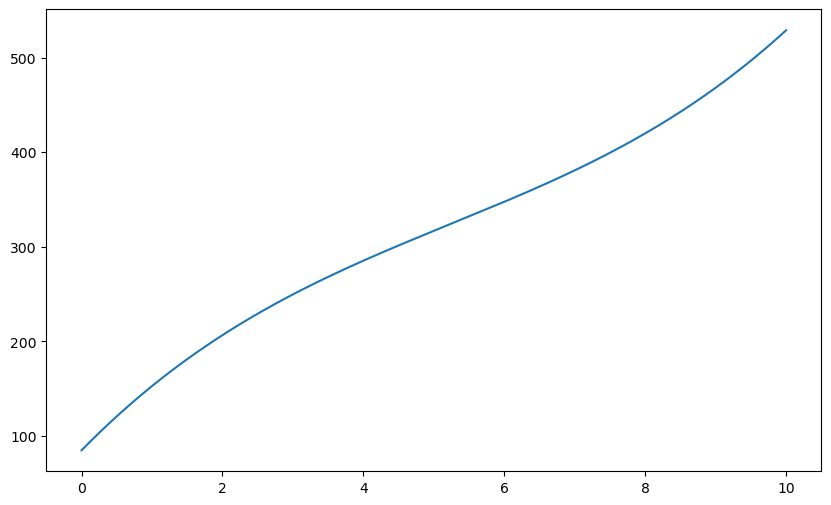

In [56]:
plt.plot(potential_eng_size, predicted_co2_poly)

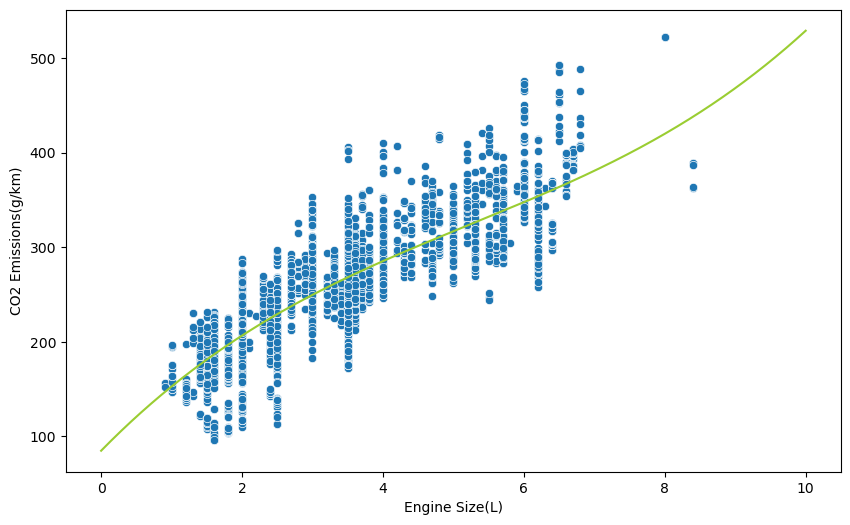

In [57]:
plt.plot(potential_eng_size, predicted_co2_poly  , color = "yellowgreen")
sns.scatterplot(x="Engine Size(L)", y="CO2 Emissions(g/km)", data=df);

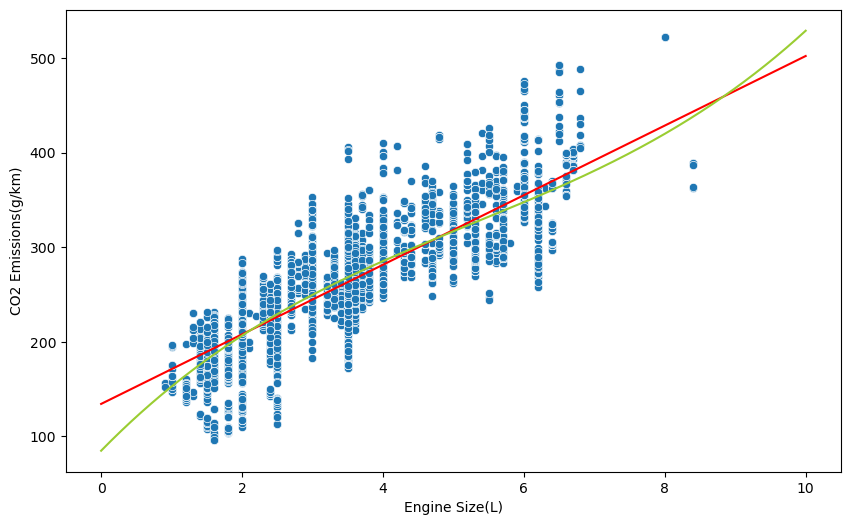

In [58]:
plt.plot(potential_eng_size, predicted_co2 , color ="r")
plt.plot(potential_eng_size, predicted_co2_poly , color = "yellowgreen")
sns.scatterplot(x="Engine Size(L)", y="CO2 Emissions(g/km)", data=df);
plt.show()

In [59]:
y_pred_poly = a1* potential_eng_size** 3 + a2 * potential_eng_size ** 2 + a3 * potential_eng_size + a0

In [60]:
values1 = {"actual": y, "predicted": y_pred, "residual": y - y_pred, "LSE": (y - y_pred)**2}
df_2= pd.DataFrame(values1)
df_2

,actual,predicted,residual,LSE
0,196,207.920523,-11.920523,142.098871
1,221,222.631449,-1.631449,2.661626
2,136,189.531866,-53.531866,2865.660624
3,255,263.086496,-8.086496,65.391416
4,244,263.086496,-19.086496,364.294325
...,...,...,...,...
7380,219,207.920523,11.079477,122.754808
7381,232,207.920523,24.079477,579.821208
7382,240,207.920523,32.079477,1029.092838
7383,232,207.920523,24.079477,579.821208


In [61]:
values2 = {"actual": y, "predicted": y_pred_poly, "residual": y - y_pred_poly, "LSE": (y - y_pred_poly)**2}
df_3 = pd.DataFrame(values2)
df_3

,actual,predicted,residual,LSE
0,196,84.891052,111.108948,12345.198360
1,221,84.994021,136.005979,18497.626253
2,136,85.096959,50.903041,2591.119606
3,255,85.199864,169.800136,28832.086047
4,244,85.302738,158.697262,25184.820915
...,...,...,...,...
7380,219,528.493731,-309.493731,95786.369235
7381,232,528.585824,-296.585824,87963.150750
7382,240,528.677946,-288.677946,83334.956273
7383,232,528.770097,-296.770097,88072.490220


In [62]:
LSE_linear = df_2.LSE.sum()
LSE_poly = df_3.LSE.sum()

In [63]:
print(f"LSE Linear:", {LSE_linear})
print(f"LSE Polynomial:", {LSE_poly})

LSE Linear: {6966208.685372684}
LSE Polynomial: {151261258.89676154}


In [64]:
t1,t2,t3,t4,t0= np.polyfit(X, y, deg=4)
print(t1,t2,t3,t4,t0)

0.05399126251731948 -0.3649285519810398 -3.2769758612804947 63.09022399157125 95.33320742286864


In [65]:
predicted_co2_poly4 = t1*potential_eng_size**4 + t2*potential_eng_size**3 + t3*potential_eng_size**2 + t4*potential_eng_size** +t0
predicted_co2_poly4

array([ 0.00000000e+00, -6.01111928e-06, -2.40481007e-05, ...,
        1.32420069e+97,  1.34141152e+97,  1.35884366e+97])

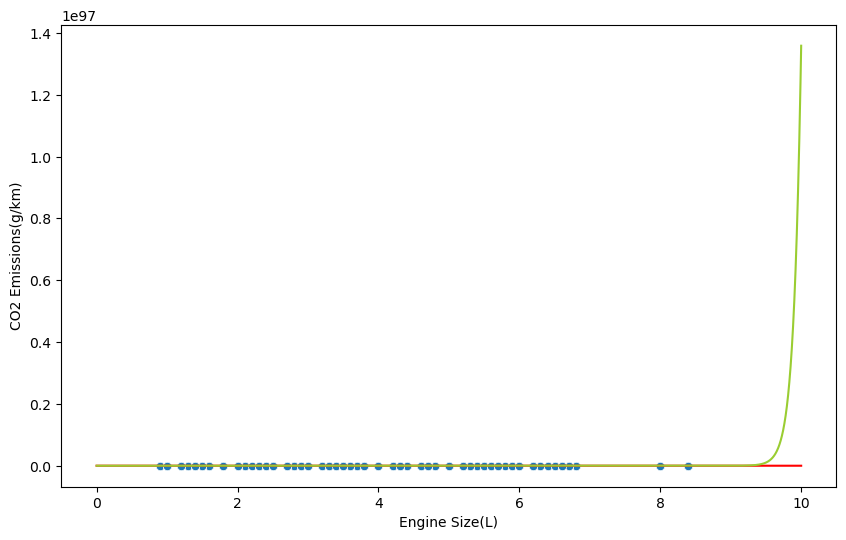

In [66]:

plt.plot(potential_eng_size, predicted_co2, color = "red")
plt.plot(potential_eng_size, predicted_co2_poly4, color = "yellowgreen")
sns.scatterplot(x="Engine Size(L)", y="CO2 Emissions(g/km)", data=df);
plt.show()

In [67]:
y_pred_poly4 = t1* potential_eng_size** 4 + t2 * potential_eng_size ** 3 + t3 * potential_eng_size**2 +t2 * potential_eng_size**2 + t0

In [68]:
values3 = {"actual": y, "predicted": y_pred_poly4, "residual": y - y_pred_poly4, "LSE": (y - y_pred_poly4)**2}
df_4= pd.DataFrame(values3)
df_4

,actual,predicted,residual,LSE
0,196,95.333207,100.666793,10133.803128
1,221,95.333201,125.666799,15792.144436
2,136,95.333181,40.666819,1653.790192
3,255,95.333147,159.666853,25493.503857
4,244,95.333100,148.666900,22101.847009
...,...,...,...,...
7380,219,-94.054916,313.054916,98003.380333
7381,232,-94.009575,326.009575,106282.242948
7382,240,-93.964169,333.964169,111532.066037
7383,232,-93.918697,325.918697,106222.997311


In [69]:
LSE_linear = df_2.LSE.sum()
LSE_poly = df_3.LSE.sum()

In [70]:
print(f"LSE Linear:", {LSE_linear})
print(f"LSE Polynomial:", {LSE_poly})

LSE Linear: {6966208.685372684}
LSE Polynomial: {151261258.89676154}


## <font color='blue'> <b>Splitting the dataset into X (independent variables) and y (dependent variable)</b><font color='black'>

In [42]:
X = df[["Engine Size(L)"]]     # features  # DataFrame olarak kalacak şekilde çift köşeli parantez kullanıyoruz
y = df["CO2 Emissions(g/km)"]   # target variable
print(X,y)

      Engine Size(L)
0                2.0
1                2.4
2                1.5
3                3.5
4                3.5
...              ...
7380             2.0
7381             2.0
7382             2.0
7383             2.0
7384             2.0

[7385 rows x 1 columns] 0       196
1       221
2       136
3       255
4       244
       ... 
7380    219
7381    232
7382    240
7383    232
7384    248
Name: CO2 Emissions(g/km), Length: 7385, dtype: int64


## <font color='blue'> <b>Train | Test Split</b><font color='black'>

In [69]:
from sklearn.model_selection import train_test_split

In [70]:
X_train_slr, X_test_slr, y_train_slr, y_test_slr = train_test_split(X,y, test_size=0.2, random_state=42)

In [71]:
print("X Train features shape: {}\ny Train features shape: {}\nX Test features shape : {}\nY Test features shape : {}".format
      (X_train_slr.shape, y_train_slr.shape, X_test_slr.shape, y_test_slr.shape))


X Train features shape: (5908, 1)
y Train features shape: (5908,)
X Test features shape : (1477, 1)
Y Test features shape : (1477,)


# Model Fitting and Compare Actual and Predicted Labels

## <font color='blue'> <b>Training the Model</b><font color='black'>

In [72]:
from sklearn.linear_model import LinearRegression  

In [73]:
slm= LinearRegression()
slm

LinearRegression()

In [74]:
slm.fit(X_train_slr, y_train_slr)

LinearRegression()

In [54]:
slm.coef_  

array([36.61217814])

In [55]:
slm.intercept_  

135.05657623459336

**CO2 Emissions(g/km)=36.61217814×Engine Size(L)+intercept

 ## <font color='blue'> <b>Predicting Test Data</b><font color='black'>

In [75]:
y_pred_slr = slm.predict(X_test_slr)
y_pred_slr

array([244.89311066, 296.15016006, 362.05208072, ..., 186.31362563,
       263.19919973, 208.28093252])

In [76]:
my_dict = {"Actual": y_test_slr, "pred": y_pred_slr, "residual":y_test_slr - y_pred_slr}

In [77]:
comparing =pd.DataFrame(my_dict)
comparing

,Actual,pred,residual
7261,253,244.893111,8.106889
4489,344,296.150160,47.849840
1539,322,362.052081,-40.052081
3532,297,329.101120,-32.101120
6418,308,281.505289,26.494711
...,...,...,...
7185,221,208.280933,12.719067
1740,260,208.280933,51.719067
4609,184,186.313626,-2.313626
1844,235,263.199200,-28.199200


In [91]:
df.iloc[7261]

Engine Size(L)           3.0
CO2 Emissions(g/km)    253.0
Name: 7261, dtype: float64

In [92]:
df.iloc[6418]

Engine Size(L)           4.0
CO2 Emissions(g/km)    308.0
Name: 6418, dtype: float64

In [93]:
comparing.residual.sum().round()

-1247.0

In [78]:
result_sample=comparing.head(25)

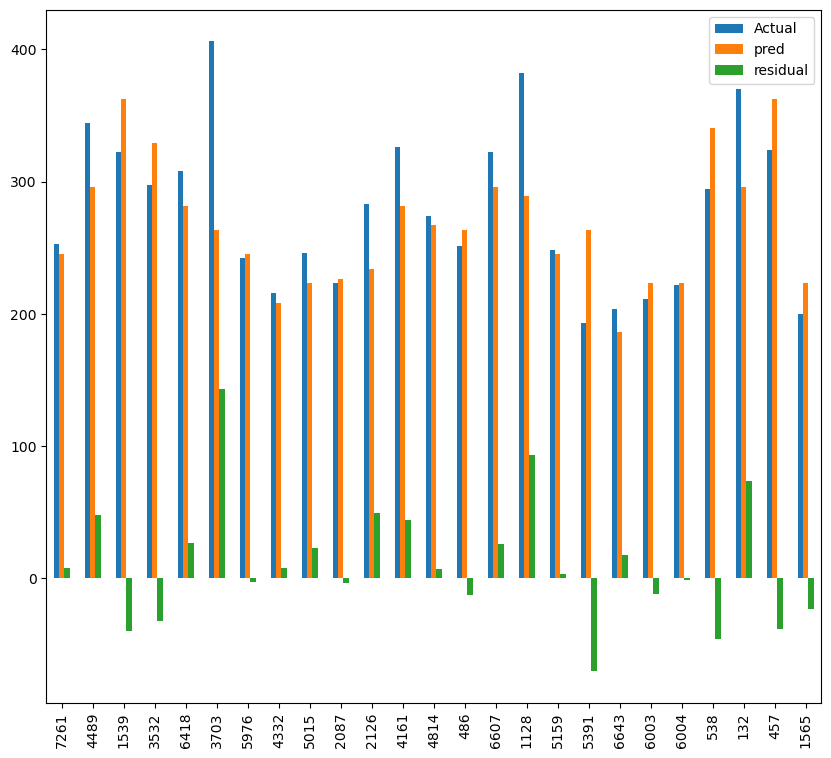

In [79]:
result_sample.plot(kind= "bar", figsize = (10,9))
plt.show()

## Error Matrics

In [80]:
from sklearn.metrics import mean_absolute_error,mean_squared_error, r2_score

In [81]:
R2_score = r2_score(y_test_slr, y_pred_slr)
R2_score

0.7238115822302345

In [82]:
rmse = np.sqrt(mean_squared_error(y_test_slr, y_pred_slr))
rmse

30.821830791462336

In [83]:

def eval_metric(actual, pred):
    mae = mean_absolute_error(actual, pred)
    mse = mean_squared_error(actual, pred)
    rmse = np.sqrt(mean_squared_error(actual, pred))
    R2_score = r2_score(actual, pred)
    print("Model testing performance: ")
    print("---------------------------")
    print(f"R2_score \t: {R2_score}")
    print(f"MAE \t\t: {mae}")
    print(f"MSE \t\t: {mse}")
    print(f"RMSE \t\t: {rmse}")

In [84]:
eval_metric(y_test_slr, y_pred_slr)

Model testing performance: 
---------------------------
R2_score 	: 0.7238115822302345
MAE 		: 22.927177134342056
MSE 		: 949.9852533375358
RMSE 		: 30.821830791462336


In [101]:
# X_train degerlerini prediction yapacağız
y_train_slr_pred = slm.predict(X_train_slr)

In [102]:
eval_metric(y_train_slr, y_train_slr_pred)

Model testing performance: 
---------------------------
R2_score 	: 0.7245276280573065
MAE 		: 23.374986568616432
MSE 		: 941.7163581594913
RMSE 		: 30.687397383282462


In [103]:
residuals = y_test_slr - y_pred_slr

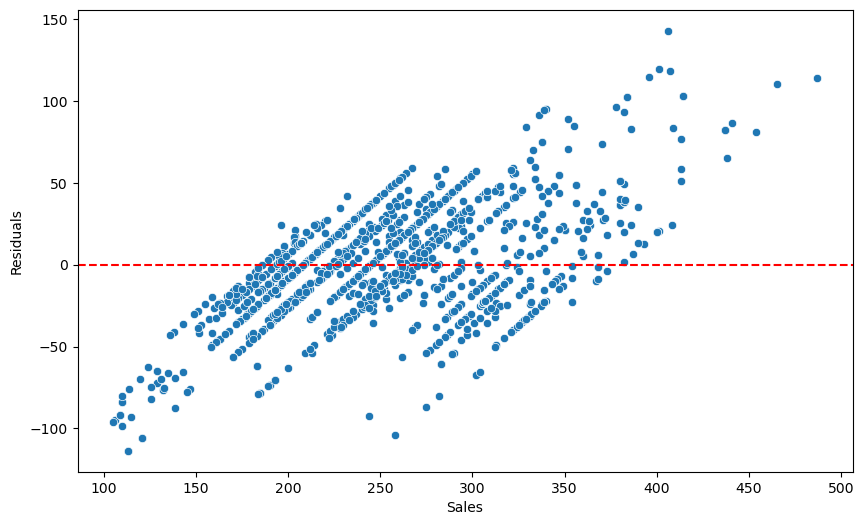

In [104]:
plt.figure(figsize=(10, 6))

sns.scatterplot(x= y_test_slr, y=residuals)
plt.xlabel("Sales")
plt.ylabel("Residuals")
plt.axhline(y=0, color = "r", linestyle ="--" )
plt.show()

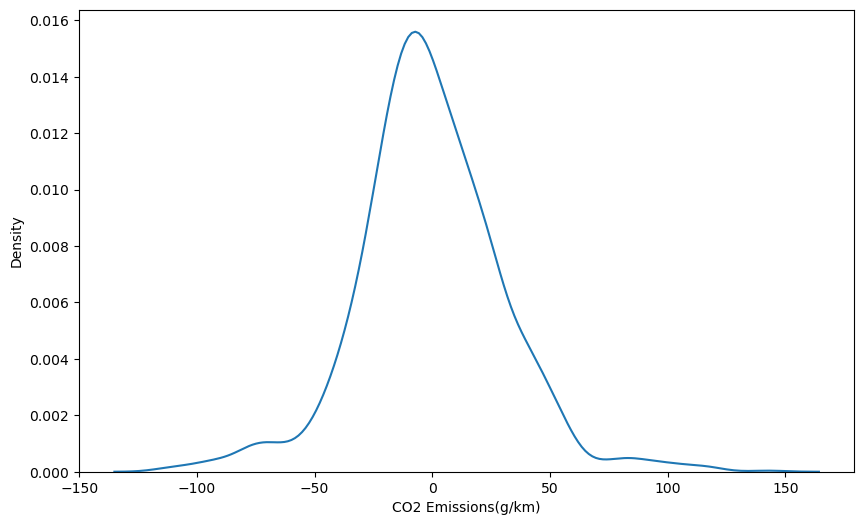

In [105]:
sns.kdeplot(residuals);

((array([-3.30838184, -3.05140859, -2.90851776, ...,  2.90851776,
          3.05140859,  3.30838184]),
  array([-113.58702159, -113.58702159, -105.58702159, ...,  118.17227557,
          119.4947112 ,  142.80080027])),
 (30.4877483473726, -0.8441963542405128, 0.9875804109940747))

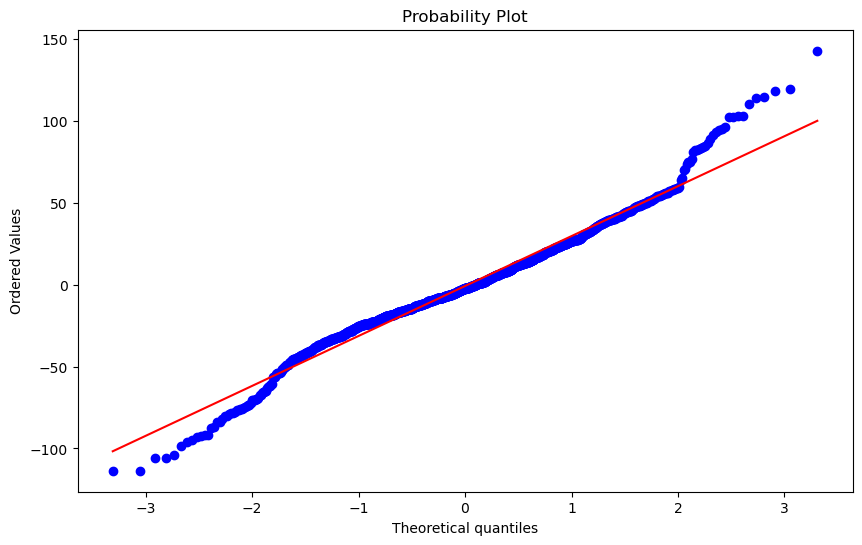

In [106]:
stats.probplot(residuals, dist = "norm", plot = plt)

# Multileaner Regression

In [107]:
df = pd.read_csv("co2.csv")
df

,Make,Model,Vehicle Class,Engine Size(L),Cylinders,Transmission,Fuel Type,Fuel Consumption City (L/100 km),Fuel Consumption Hwy (L/100 km),Fuel Consumption Comb (L/100 km),Fuel Consumption Comb (mpg),CO2 Emissions(g/km)
0,ACURA,ILX,COMPACT,2.0,4,AS5,Z,9.9,6.7,8.5,33,196
1,ACURA,ILX,COMPACT,2.4,4,M6,Z,11.2,7.7,9.6,29,221
2,ACURA,ILX HYBRID,COMPACT,1.5,4,AV7,Z,6.0,5.8,5.9,48,136
3,ACURA,MDX 4WD,SUV - SMALL,3.5,6,AS6,Z,12.7,9.1,11.1,25,255
4,ACURA,RDX AWD,SUV - SMALL,3.5,6,AS6,Z,12.1,8.7,10.6,27,244
...,...,...,...,...,...,...,...,...,...,...,...,...
7380,VOLVO,XC40 T5 AWD,SUV - SMALL,2.0,4,AS8,Z,10.7,7.7,9.4,30,219
7381,VOLVO,XC60 T5 AWD,SUV - SMALL,2.0,4,AS8,Z,11.2,8.3,9.9,29,232
7382,VOLVO,XC60 T6 AWD,SUV - SMALL,2.0,4,AS8,Z,11.7,8.6,10.3,27,240
7383,VOLVO,XC90 T5 AWD,SUV - STANDARD,2.0,4,AS8,Z,11.2,8.3,9.9,29,232


In [108]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7385 entries, 0 to 7384
Data columns (total 12 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   Make                              7385 non-null   object 
 1   Model                             7385 non-null   object 
 2   Vehicle Class                     7385 non-null   object 
 3   Engine Size(L)                    7385 non-null   float64
 4   Cylinders                         7385 non-null   int64  
 5   Transmission                      7385 non-null   object 
 6   Fuel Type                         7385 non-null   object 
 7   Fuel Consumption City (L/100 km)  7385 non-null   float64
 8   Fuel Consumption Hwy (L/100 km)   7385 non-null   float64
 9   Fuel Consumption Comb (L/100 km)  7385 non-null   float64
 10  Fuel Consumption Comb (mpg)       7385 non-null   int64  
 11  CO2 Emissions(g/km)               7385 non-null   int64  
dtypes: flo

In [109]:
df.shape

(7385, 12)

In [110]:
X = df[["Engine Size(L)",
        "Fuel Consumption City (L/100 km)",
        "Fuel Consumption Hwy (L/100 km)",
        "Fuel Consumption Comb (L/100 km)"
       ]]   
y = df["CO2 Emissions(g/km)"]                
print(X,y)

      Engine Size(L)  Fuel Consumption City (L/100 km)  \
0                2.0                               9.9   
1                2.4                              11.2   
2                1.5                               6.0   
3                3.5                              12.7   
4                3.5                              12.1   
...              ...                               ...   
7380             2.0                              10.7   
7381             2.0                              11.2   
7382             2.0                              11.7   
7383             2.0                              11.2   
7384             2.0                              12.2   

      Fuel Consumption Hwy (L/100 km)  Fuel Consumption Comb (L/100 km)  
0                                 6.7                               8.5  
1                                 7.7                               9.6  
2                                 5.8                               5.9  
3      

In [111]:
from sklearn.model_selection import train_test_split

In [112]:
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.2, random_state=0)

In [113]:
print("X Train features shape: {}\ny Train features shape: {}\nX Test features shape : {}\nY Test features shape : {}".format
      (X_train.shape, y_train.shape, X_test.shape, y_test.shape))


X Train features shape: (5169, 4)
y Train features shape: (5169,)
X Test features shape : (2216, 4)
Y Test features shape : (2216,)


In [114]:
X_test

,Engine Size(L),Fuel Consumption City (L/100 km),Fuel Consumption Hwy (L/100 km),Fuel Consumption Comb (L/100 km)
7261,3.0,12.4,9.0,10.9
4489,4.4,17.3,11.6,14.7
1539,6.2,16.1,11.4,14.0
3532,5.3,14.6,10.3,12.7
6418,4.0,14.3,11.9,13.2
...,...,...,...,...
5123,4.0,15.5,10.6,13.3
5359,2.5,9.3,7.0,8.3
7294,2.0,9.7,7.2,8.6
2569,2.0,10.9,7.9,9.6


In [115]:
y_test

7261    253
4489    344
1539    322
3532    297
6418    308
       ... 
5123    313
5359    193
7294    200
2569    224
1086    338
Name: CO2 Emissions(g/km), Length: 2216, dtype: int64

In [116]:
X_train

,Engine Size(L),Fuel Consumption City (L/100 km),Fuel Consumption Hwy (L/100 km),Fuel Consumption Comb (L/100 km)
6130,2.2,8.9,7.9,8.4
7188,3.0,12.7,10.1,11.6
6304,3.0,10.6,8.0,9.4
6017,3.6,12.8,10.4,11.8
2348,4.4,15.7,11.4,13.8
...,...,...,...,...
5191,2.0,10.3,7.4,9.0
5226,3.5,10.6,7.3,9.1
5390,3.5,11.7,8.8,10.4
860,2.5,9.5,7.4,8.6


# Model Fitting and Compare Actual and Predicted Labels

In [117]:
from sklearn.linear_model import LinearRegression

In [118]:
lm = LinearRegression()

In [119]:
lm.fit(X_train, y_train)

LinearRegression()

In [120]:
y_pred = lm.predict(X_test)
y_pred

array([247.49314135, 318.24250605, 330.531149  , ..., 203.35582624,
       217.08713403, 322.16751909])

In [121]:
lm.coef_  

array([12.63210709,  2.68240309,  0.44286467, 10.20241882])

In [122]:
lm.feature_names_in_ 

array(['Engine Size(L)', 'Fuel Consumption City (L/100 km)',
       'Fuel Consumption Hwy (L/100 km)',
       'Fuel Consumption Comb (L/100 km)'], dtype=object)

In [123]:
lm.intercept_ 

61.14287465659669

In [124]:
dict = {"Actual": y_test, "pred": y_pred, "residual":y_test - y_pred}

In [125]:
comparing_lm=pd.DataFrame(dict)
comparing_lm

,Actual,pred,residual
7261,253,247.493141,5.506859
4489,344,318.242506,25.757494
1539,322,330.531149,-8.531149
3532,297,301.388352,-4.388352
6418,308,289.971685,18.028315
...,...,...,...
5123,313,293.635087,19.364913
5359,193,205.449620,-12.449620
7294,200,203.355826,-3.355826
2569,224,217.087134,6.912866


In [126]:
result_sample_lm = comparing_lm.head(25)
result_sample_lm

,Actual,pred,residual
7261,253,247.493141,5.506859
4489,344,318.242506,25.757494
1539,322,330.531149,-8.531149
3532,297,301.388352,-4.388352
6418,308,289.971685,18.028315
3703,406,342.960412,63.039588
5976,242,240.829298,1.170702
4332,216,212.685207,3.314793
5015,246,233.551606,12.448394
2087,223,224.824529,-1.824529


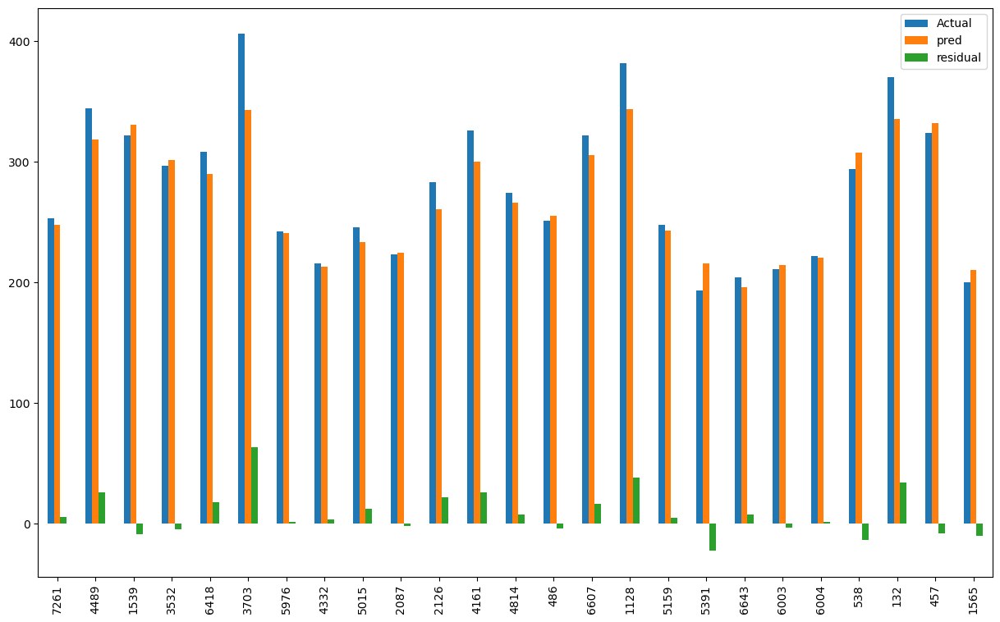

In [127]:
result_sample_lm.plot(kind= "bar", figsize = (15,9))
plt.show()

# Error Metrics

In [128]:
from sklearn.metrics import mean_absolute_error,mean_squared_error, r2_score

In [129]:
R2_score = r2_score(y_test, y_pred)
R2_score

0.8696343237869403

In [130]:
mae = mean_absolute_error(y_test, y_pred)
mae

13.480594300830528

In [131]:
# Mean squared error hesabı
mse = mean_squared_error(y_test, y_pred)
mse

440.3368664459096

In [132]:
# Root Mean Squared Error - RMSE  hesabı

rmse = np.sqrt(mean_squared_error(y_test, y_pred))
rmse

20.98420516593158

In [133]:

def eval_metric(actual, pred):
    mae = mean_absolute_error(actual, pred)
    mse = mean_squared_error(actual, pred)
    rmse = np.sqrt(mean_squared_error(actual, pred))
    R2_score = r2_score(actual, pred)
    print("Model testing performance: ")
    print("---------------------------")
    print(f"R2_score \t: {R2_score}")
    print(f"MAE \t\t: {mae}")
    print(f"MSE \t\t: {mse}")
    print(f"RMSE \t\t: {rmse}")

In [134]:
eval_metric(y_test, y_pred)

Model testing performance: 
---------------------------
R2_score 	: 0.8696343237869403
MAE 		: 13.480594300830528
MSE 		: 440.3368664459096
RMSE 		: 20.98420516593158


# Adjusted R2 Score (düzeltilmiş R2 degeri)

In [135]:
def adj_r2(y_test, y_pred, df):
    r2 = r2_score(y_test, y_pred)    #R2 scor
    n = df.shape[0]      # number of observations gözlem
    p =df.shape[1]-1    # number of indep. variable = feature
    adj_r2 = 1 - (1-r2)*(n-1)/(n-p-1)   
    return adj_r2

In [136]:
adj_r2(y_test, y_pred, df)

0.8694398273216828

In [137]:
def adj_r2(y_test, y_pred, df):
    r2 = r2_score(y_test, y_pred)
    n = df.shape[0]   # number of observations
    p = 100 # number of independent variables ..feature sayısıı 100 aldık
    adj_r2 = 1 - (1-r2)*(n-1)/(n-p-1)
    return adj_r2

In [138]:
adj_r2(y_test, y_pred, df)

0.8678445698576012

# Evaluation Model

In [139]:
# X_train degerlerini prediction yapacağız
y_train_pred = lm.predict(X_train)

In [140]:
eval_metric(y_train, y_train_pred)

Model testing performance: 
---------------------------
R2_score 	: 0.8753401034629793
MAE 		: 13.398753941235901
MSE 		: 429.0443041489846
RMSE 		: 20.713384661831213


In [141]:
eval_metric(y_test, y_pred)

Model testing performance: 
---------------------------
R2_score 	: 0.8696343237869403
MAE 		: 13.480594300830528
MSE 		: 440.3368664459096
RMSE 		: 20.98420516593158


In [142]:
residuals = y_test - y_pred
residuals.sum()

-994.7439179021344

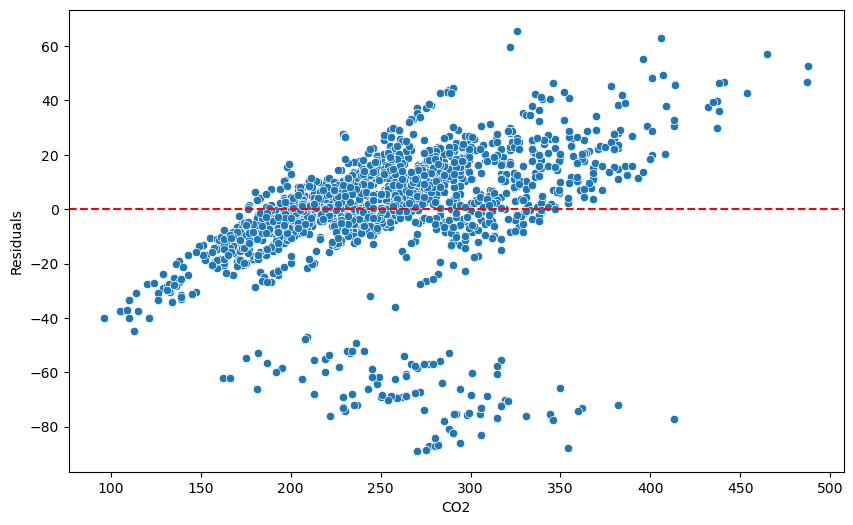

In [143]:
plt.figure(figsize=(10, 6))

sns.scatterplot(x= y_test, y=residuals)
plt.xlabel("CO2")
plt.ylabel("Residuals")
plt.axhline(y=0, color = "r", linestyle ="--" )
plt.show()

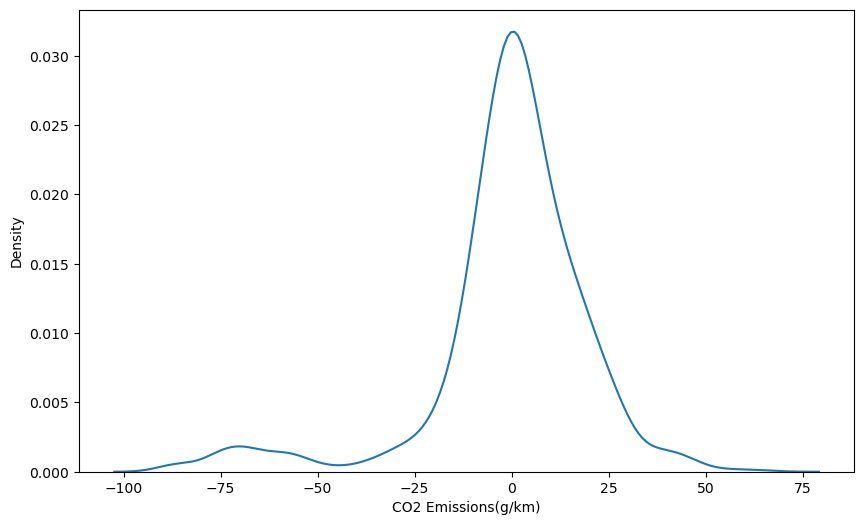

In [144]:
sns.kdeplot(residuals);

((array([-3.42031516, -3.17117209, -3.03309047, ...,  3.03309047,
          3.17117209,  3.42031516]),
  array([-88.88802643, -88.78214777, -88.78214777, ...,  59.62244958,
          63.03958774,  65.66763124])),
 (19.43567545518012, -0.44889165970313344, 0.925140512870285))

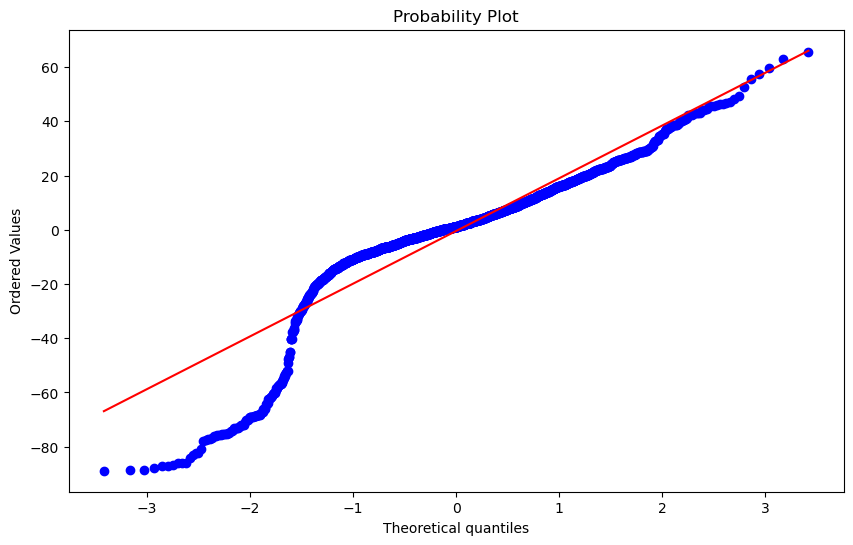

In [145]:
stats.probplot(residuals, dist = "norm", plot = plt)

In [146]:
from scipy.stats import skew

In [147]:
skew(residuals)

-1.5482781348749255

In [148]:
pip install yellowbrick 

  Using cached yellowbrick-1.5-py3-none-any.whl (282 kB)
Note: you may need to restart the kernel to use updated packages.


In [149]:
from yellowbrick.regressor import ResidualsPlot

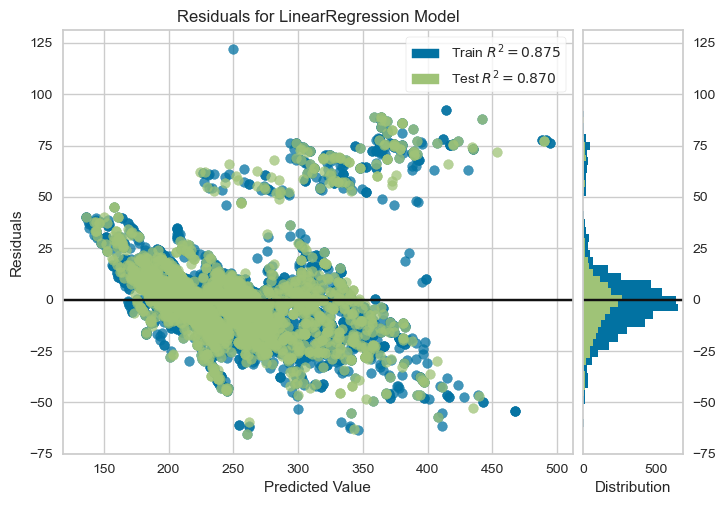

<Axes: title={'center': 'Residuals for LinearRegression Model'}, xlabel='Predicted Value', ylabel='Residuals'>

In [150]:
# Instantiate the linear model and visualizer
lm = LinearRegression()
visualizer = ResidualsPlot(lm)

visualizer.fit(X_train, y_train)  # Fit the training data to the visualizer
visualizer.score(X_test, y_test)  # Evaluate the model on the test data
visualizer.show()                 # Finalize and render the figure

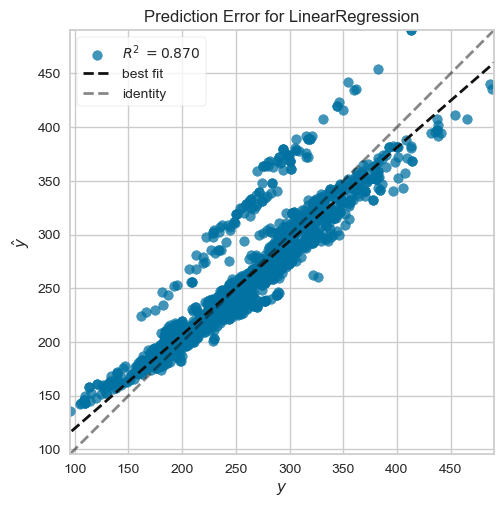

<Axes: title={'center': 'Prediction Error for LinearRegression'}, xlabel='$y$', ylabel='$\\hat{y}$'>

In [151]:
from yellowbrick.regressor import PredictionError
lm = LinearRegression()
visualizer = PredictionError(lm)

visualizer.fit(X_train, y_train)  # Fit the training data to the visualizer
visualizer.score(X_test, y_test)  # Evaluate the model on the test data
visualizer.show()                 # Finalize and render the figure

# Polynomial Regression 

In [152]:
from sklearn.preprocessing import PolynomialFeatures

In [153]:
print(X,y)

      Engine Size(L)  Fuel Consumption City (L/100 km)  \
0                2.0                               9.9   
1                2.4                              11.2   
2                1.5                               6.0   
3                3.5                              12.7   
4                3.5                              12.1   
...              ...                               ...   
7380             2.0                              10.7   
7381             2.0                              11.2   
7382             2.0                              11.7   
7383             2.0                              11.2   
7384             2.0                              12.2   

      Fuel Consumption Hwy (L/100 km)  Fuel Consumption Comb (L/100 km)  
0                                 6.7                               8.5  
1                                 7.7                               9.6  
2                                 5.8                               5.9  
3      

In [154]:
poly_conv = PolynomialFeatures(degree=4, include_bias=False)

In [155]:
poly_conv.fit(X)

PolynomialFeatures(degree=4, include_bias=False)

In [156]:
poly_features = poly_conv.transform(X)  

In [157]:
poly_features.shape 

(7385, 69)

In [158]:
X.shape

(7385, 4)

In [159]:
X_train, X_test, y_train, y_test = train_test_split(poly_features, y, test_size=0.3, random_state=42)

## Model fitting

In [160]:
from sklearn.linear_model import LinearRegression

In [161]:
model_poly = LinearRegression()

In [162]:
model_poly.fit(X_train, y_train)

LinearRegression()

In [163]:
y_pred = model_poly.predict(X_test)

In [164]:
my_dict = {"Actual":y_test, "pred":y_pred, "residual": y_test - y_pred }
compare = pd.DataFrame(my_dict)
compare.head(20)

,Actual,pred,residual
7261,253,256.794138,-3.794138
4489,344,319.325821,24.674179
1539,322,326.543036,-4.543036
3532,297,294.384018,2.615982
6418,308,310.955277,-2.955277
3703,406,338.311240,67.688760
5976,242,245.485945,-3.485945
4332,216,217.899681,-1.899681
5015,246,250.088839,-4.088839
2087,223,230.203698,-7.203698


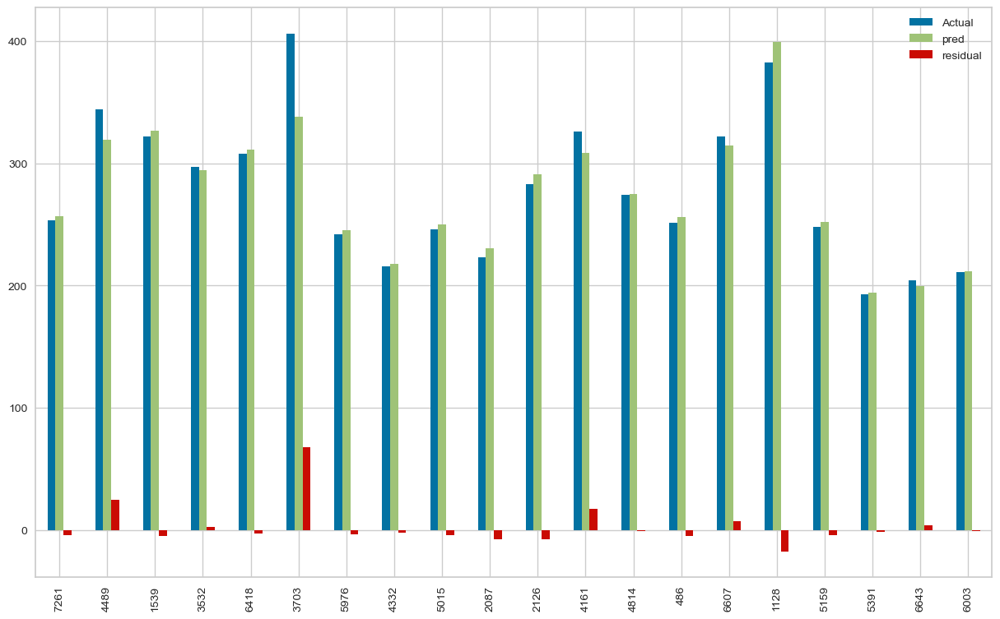

In [165]:
compare.head(20).plot(kind ="bar", figsize =(15,9))
plt.show();

## Polynomial Coefficients - katsayılar

In [166]:
model_poly.coef_

array([-1.36481242e+01, -4.18118283e+02, -5.30438941e+02,  8.26971513e+02,
        2.50777657e+01,  1.93758938e+02,  1.90328578e+02, -3.92495966e+02,
        3.71432277e+02,  7.92919713e+02, -1.43536240e+03,  4.27847108e+02,
       -1.52167982e+03,  1.38932741e+03,  1.11123172e+01,  7.05976100e+01,
        6.62532800e+01, -1.51042531e+02,  3.93755047e+02,  7.05167766e+02,
       -1.56090505e+03,  3.38402631e+02, -1.44105354e+03,  1.56946960e+03,
       -1.06309072e+03, -3.04870170e+03,  6.04179163e+03, -2.78790749e+03,
        1.13245247e+04, -1.13351671e+04, -8.06954432e+02,  5.04998672e+03,
       -1.03841886e+04,  7.00767827e+03,  7.56120613e-01, -2.92344593e+00,
       -1.81377423e+00,  3.01962089e+00, -3.98960614e+01, -7.61362446e+01,
        1.50938655e+02, -3.58683006e+01,  1.42398302e+02, -1.40202972e+02,
       -2.03314354e+02, -4.60218293e+02,  1.07253923e+03, -3.77268640e+02,
        1.66860017e+03, -1.90238016e+03, -1.13605590e+02,  7.08303996e+02,
       -1.52660661e+03,  

# Evaluation on the Test Set

In [167]:
from sklearn.metrics import mean_absolute_error,mean_squared_error,r2_score

In [168]:
y_pred = model_poly.predict(X_test)

In [169]:
eval_metric(y_test, y_pred) 

Model testing performance: 
---------------------------
R2_score 	: 0.9356164151581892
MAE 		: 7.43543212043776
MSE 		: 217.46879104484137
RMSE 		: 14.746823083120017


In [170]:
y_train_pred = model_poly.predict(X_train)   

In [171]:
eval_metric(y_train, y_train_pred) 

Model testing performance: 
---------------------------
R2_score 	: 0.9442114196227058
MAE 		: 6.897776991178534
MSE 		: 192.00860350728416
RMSE 		: 13.856716909401165


In [172]:
def poly(d):   # degree derecesi içine ne yazarsam ona göre çözüm oluşturacak
    
    train_rmse_errors = []   # trains rmse değerlerin toplayacak
    test_rmse_errors = []    # test rmse değerlerin toplayacak
    number_of_features = []  # derece arttıkça feature sayısının kaça çıktığnı göreceğiz
    
    for i in range(1, d):  # 1 den kaçıncı dereceye kadar istiyorsak ona göre yazacağız
        polynomial_converter = PolynomialFeatures(degree = i, include_bias =False)
        poly_features = polynomial_converter.fit_transform(X)
        
        X_train, X_test, y_train, y_test = train_test_split(poly_features, y, test_size=0.3, random_state=101)
        
        model = LinearRegression(fit_intercept=True) 
        model.fit(X_train, y_train)
        
        train_pred = model.predict(X_train)
        test_pred = model.predict(X_test)
        
        train_RMSE = np.sqrt(mean_squared_error(y_train,train_pred))
        test_RMSE = np.sqrt(mean_squared_error(y_test,test_pred))
        
        train_rmse_errors.append(train_RMSE)
        test_rmse_errors.append(test_RMSE)
        
        number_of_features.append(poly_features.shape[1])
        
    return pd.DataFrame({"train_rmse_errors": train_rmse_errors, "test_rmse_errors":test_rmse_errors, "number of features":number_of_features}, 
                        index=range(1,d))

In [173]:
poly(10)

KeyboardInterrupt: 

In [ ]:
plt.plot(range(1,10), poly(10)["train_rmse_errors"], label = "TRAIN")
plt.plot(range(1,10), poly(10)["test_rmse_errors"], label = "TEST")
plt.xlabel("Polynamial Complex")
plt.ylabel("RMSE")
plt.legend();
plt.show()

In [ ]:

plt.plot(range(1,6), poly(6)["train_rmse_errors"], label = "TRAIN")
plt.plot(range(1,6), poly(6)["test_rmse_errors"], label = "TEST")
plt.xlabel("Polynamial Complex")
plt.ylabel("RMSE")
plt.legend();
plt.show()

## Scaling the Data

In [174]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler

In [175]:
scaler = StandardScaler()

In [176]:
scaler.fit(X_train)

StandardScaler()

In [177]:
X_train_scaled = scaler.transform(X_train)
X_train_scaled

array([[-0.71235412, -1.04936647, -0.52119825, ..., -0.5017534 ,
        -0.52788342, -0.54805264],
       [-0.12513485,  0.03277462,  0.47101105, ..., -0.03867926,
        -0.08280189, -0.12470676],
       [-0.12513485, -0.56525072, -0.47609783, ..., -0.43959551,
        -0.4490769 , -0.45682931],
       ...,
       [ 0.2418772 , -0.25199935, -0.11529444, ..., -0.304447  ,
        -0.31839076, -0.33134793],
       [-0.49214689, -0.87850208, -0.74670036, ..., -0.51931709,
        -0.5269014 , -0.53220684],
       [ 0.60888924,  0.23211641,  0.47101105, ..., -0.0029573 ,
        -0.03239875, -0.06191929]])

In [178]:
X_test_scaled = scaler.transform(X_test)
X_test_scaled

array([[-0.12513485, -0.05265757, -0.0250936 , ..., -0.24247244,
        -0.24785129, -0.25339626],
       [ 0.90249888,  1.3427349 ,  1.14751739, ...,  0.72380154,
         0.76387749,  0.79722471],
       [ 2.22374224,  1.00100613,  1.05731654, ...,  0.54474182,
         0.54034386,  0.53024432],
       ...,
       [-0.85915894, -0.82154729, -0.83690121, ..., -0.53004421,
        -0.53201021, -0.53220684],
       [-0.85915894, -0.47981852, -0.52119825, ..., -0.43479403,
        -0.43523202, -0.43470772],
       [ 1.12270611,  1.37121229,  1.01221612, ...,  0.65006295,
         0.72560667,  0.79722471]])

In [179]:
pd.DataFrame(X_train_scaled).agg(["mean", "std"]).round()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68
mean,0.0,0.0,-0.0,0.0,0.0,-0.0,0.0,0.0,-0.0,-0.0,-0.0,0.0,-0.0,-0.0,0.0,0.0,0.0,0.0,-0.0,0.0,-0.0,0.0,0.0,0.0,0.0,0.0,-0.0,0.0,-0.0,-0.0,0.0,-0.0,0.0,0.0,-0.0,0.0,-0.0,-0.0,-0.0,-0.0,0.0,-0.0,-0.0,0.0,-0.0,-0.0,-0.0,-0.0,0.0,0.0,0.0,0.0,0.0,-0.0,0.0,-0.0,-0.0,-0.0,-0.0,0.0,0.0,0.0,0.0,-0.0,-0.0,0.0,0.0,-0.0,-0.0
std,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0


In [180]:
pd.DataFrame(X_test_scaled).agg(["mean", "std"]).round().T

,mean,std
0,-0.0,1.0
1,-0.0,1.0
2,-0.0,1.0
3,-0.0,1.0
4,-0.0,1.0
...,...,...
64,-0.0,1.0
65,-0.0,1.0
66,-0.0,1.0
67,-0.0,1.0


In [ ]:
normscaler = MinMaxScaler()

In [ ]:
normscaler.fit(X_train)

In [ ]:
X_train_normscaled = normscaler.transform(X_train)
X_train_normscaled

In [ ]:
X_test_normscaled = normscaler.transform(X_test)
X_test_normscaled

In [ ]:
pd.DataFrame(X_train_normscaled).agg(["mean", "std"]).round()

In [ ]:
pd.DataFrame(X_test_normscaled).agg(["mean", "std"]).round()

# Linear Regression

In [181]:
from sklearn.linear_model import LinearRegression

In [182]:
lm = LinearRegression()

In [183]:
lm.fit(X_train_scaled, y_train)

LinearRegression()

In [184]:
y_pred = lm.predict(X_test_scaled)
y_train_pred = lm.predict(X_train_scaled)

In [185]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

def train_val(y_train, y_train_pred, y_test, y_pred, i): 
    
    scores = {i+"_train": {"R2" : r2_score(y_train, y_train_pred),
    "mae" : mean_absolute_error(y_train, y_train_pred),
    "mse" : mean_squared_error(y_train, y_train_pred),                          
    "rmse" : np.sqrt(mean_squared_error(y_train, y_train_pred))},
    
    i+"_test": {"R2" : r2_score(y_test, y_pred),
    "mae" : mean_absolute_error(y_test, y_pred),
    "mse" : mean_squared_error(y_test, y_pred),
    "rmse" : np.sqrt(mean_squared_error(y_test, y_pred))}}
    
    return pd.DataFrame(scores)

In [186]:
ls = train_val(y_train, y_train_pred, y_test, y_pred, "linear") 
ls 

,linear_train,linear_test
R2,0.944211,0.935616
mae,6.897777,7.435432
mse,192.008604,217.468791
rmse,13.856717,14.746823


#  Multicolinearty

In [187]:
def color_red(val):
   
    if val > 0.90 and val < 0.99:
        color = 'red'
    elif val>=1:
        color = "blue"
    else:
        color = 'black'
    return f'color: {color}'

In [188]:
pd.DataFrame(poly_features).corr().style.applymap(color_red)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68
0,1.000000,0.831379,0.761526,0.817060,0.980374,0.959182,0.951365,0.958702,0.803603,0.773513,0.795303,0.719961,0.756818,0.784038,0.933075,0.938306,0.941868,0.940887,0.880217,0.874492,0.879563,0.855805,0.869245,0.877293,0.737222,0.718578,0.731740,0.689169,0.709142,0.724816,0.649506,0.675815,0.698222,0.716415,0.871644,0.887279,0.897587,0.891897,0.860062,0.864503,0.862680,0.859405,0.863789,0.864144,0.776747,0.772427,0.776169,0.759556,0.768779,0.774498,0.738108,0.752730,0.763963,0.771694,0.644130,0.631885,0.640473,0.613546,0.625976,0.635990,0.589467,0.605454,0.619243,0.630673,0.560281,0.579368,0.596580,0.611694,0.624520
1,0.831379,1.000000,0.948180,0.993810,0.799995,0.924279,0.920188,0.925004,0.980650,0.966895,0.978631,0.922622,0.954179,0.972908,0.748139,0.848525,0.854975,0.851982,0.921040,0.924435,0.923669,0.913400,0.921997,0.924530,0.926252,0.920552,0.925685,0.900709,0.914893,0.923296,0.866302,0.889613,0.907219,0.918993,0.688053,0.774987,0.787236,0.780142,0.843620,0.854502,0.848478,0.855759,0.856026,0.852190,0.870801,0.876237,0.873799,0.871866,0.875762,0.875576,0.857122,0.867599,0.873911,0.876063,0.842989,0.841045,0.843243,0.830775,0.838284,0.842412,0.812132,0.824900,0.834372,0.840462,0.785451,0.803183,0.817857,0.829292,0.837364
2,0.761526,0.948180,1.000000,0.977299,0.724670,0.859522,0.897695,0.875062,0.939143,0.974049,0.954340,0.983650,0.980946,0.966862,0.668823,0.777815,0.811537,0.790860,0.866488,0.900292,0.879879,0.922606,0.909861,0.892013,0.894880,0.920766,0.905614,0.934398,0.927292,0.914916,0.934201,0.935976,0.932061,0.922650,0.606187,0.700004,0.732578,0.712272,0.781545,0.814866,0.794304,0.840747,0.825188,0.806278,0.827387,0.856284,0.838723,0.876917,0.864824,0.849125,0.888034,0.882112,0.872200,0.858500,0.820989,0.841778,0.829408,0.855053,0.847586,0.836928,0.860171,0.857940,0.852356,0.843490,0.856878,0.859962,0.859695,0.856043,0.849038
3,0.817060,0.993810,0.977299,1.000000,0.783381,0.912759,0.923309,0.918720,0.977783,0.980750,0.981807,0.954643,0.974788,0.982446,0.729492,0.834025,0.850055,0.840907,0.912966,0.926982,0.919419,0.927415,0.928743,0.924264,0.926231,0.931437,0.929635,0.922986,0.929998,0.931334,0.900050,0.916217,0.926611,0.931217,0.667775,0.758101,0.777594,0.765829,0.831999,0.850836,0.839700,0.860692,0.855477,0.846369,0.865951,0.879621,0.871919,0.883903,0.882312,0.876754,0.877986,0.882914,0.883686,0.880376,0.845214,0.851152,0.848341,0.848947,0.851370,0.850436,0.838342,0.846081,0.850464,0.851456,0.819474,0.832359,0.842047,0.848405,0.851361
4,0.980374,0.799995,0.724670,0.783381,1.000000,0.960953,0.945633,0.957809,0.790580,0.754593,0.780123,0.696223,0.736065,0.766793,0.984949,0.975178,0.972022,0.975421,0.899796,0.887409,0.896788,0.862024,0.879757,0.892131,0.740837,0.716613,0.733343,0.682007,0.705271,0.724432,0.637771,0.666946,0.692505,0.714083,0.947251,0.951612,0.956463,0.954371,0.909415,0.907957,0.909992,0.896459,0.904997,0.909333,0.808998,0.798867,0.806373,0.780022,0.793087,0.802615,0.752642,0.771049,0.786122,0.797691,0.660386,0.643163,0.654944,0.619983,0.635497,0.648677,0.591351,0.610218,0.627030,0.641586,0.558028,0.579713,0.599713,0.617775,0.633676
5,0.959182,0.924279,0.859522,0.912759,0.960953,1.000000,0.989617,0.998681,0.926528,0.898725,0.919368,0.844064,0.882026,0.908862,0.931453,0.980007,0.981094,0.981746,0.975675,0.969569,0.975008,0.949090,0.963809,0.972548,0.887065,0.869235,0.882089,0.838632,0.859593,0.875420,0.795587,0.824267,0.848172,0.867002,0.883451,0.935497,0.943936,0.939485,0.951317,0.955267,0.953847,0.948672,0.954108,0.955096,0.911238,0.907221,0.910911,0.893271,0.903332,0.909316,0.869266,0.885660,0.898076,0.906403,0.813043,0.800980,0.809624,0.781305,0.794762,0.805183,0.754336,0.772328,0.787508,0.799703,0.720738,0.742772,0.762349,0.779219,0.793176
6,0.951365,0.920188,0.897695,0.923309,0.945633,0.989617,1.000000

In [189]:
def color_red(val):
    if val > 0.90 and val < 0.99:
        color = 'red'
    elif val>=1:
        color = "blue"
    else:
        color = 'white'
    return f'background-color: {color}'
pd.DataFrame(poly_features).corr().style.applymap(color_red)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68
0,1.000000,0.831379,0.761526,0.817060,0.980374,0.959182,0.951365,0.958702,0.803603,0.773513,0.795303,0.719961,0.756818,0.784038,0.933075,0.938306,0.941868,0.940887,0.880217,0.874492,0.879563,0.855805,0.869245,0.877293,0.737222,0.718578,0.731740,0.689169,0.709142,0.724816,0.649506,0.675815,0.698222,0.716415,0.871644,0.887279,0.897587,0.891897,0.860062,0.864503,0.862680,0.859405,0.863789,0.864144,0.776747,0.772427,0.776169,0.759556,0.768779,0.774498,0.738108,0.752730,0.763963,0.771694,0.644130,0.631885,0.640473,0.613546,0.625976,0.635990,0.589467,0.605454,0.619243,0.630673,0.560281,0.579368,0.596580,0.611694,0.624520
1,0.831379,1.000000,0.948180,0.993810,0.799995,0.924279,0.920188,0.925004,0.980650,0.966895,0.978631,0.922622,0.954179,0.972908,0.748139,0.848525,0.854975,0.851982,0.921040,0.924435,0.923669,0.913400,0.921997,0.924530,0.926252,0.920552,0.925685,0.900709,0.914893,0.923296,0.866302,0.889613,0.907219,0.918993,0.688053,0.774987,0.787236,0.780142,0.843620,0.854502,0.848478,0.855759,0.856026,0.852190,0.870801,0.876237,0.873799,0.871866,0.875762,0.875576,0.857122,0.867599,0.873911,0.876063,0.842989,0.841045,0.843243,0.830775,0.838284,0.842412,0.812132,0.824900,0.834372,0.840462,0.785451,0.803183,0.817857,0.829292,0.837364
2,0.761526,0.948180,1.000000,0.977299,0.724670,0.859522,0.897695,0.875062,0.939143,0.974049,0.954340,0.983650,0.980946,0.966862,0.668823,0.777815,0.811537,0.790860,0.866488,0.900292,0.879879,0.922606,0.909861,0.892013,0.894880,0.920766,0.905614,0.934398,0.927292,0.914916,0.934201,0.935976,0.932061,0.922650,0.606187,0.700004,0.732578,0.712272,0.781545,0.814866,0.794304,0.840747,0.825188,0.806278,0.827387,0.856284,0.838723,0.876917,0.864824,0.849125,0.888034,0.882112,0.872200,0.858500,0.820989,0.841778,0.829408,0.855053,0.847586,0.836928,0.860171,0.857940,0.852356,0.843490,0.856878,0.859962,0.859695,0.856043,0.849038
3,0.817060,0.993810,0.977299,1.000000,0.783381,0.912759,0.923309,0.918720,0.977783,0.980750,0.981807,0.954643,0.974788,0.982446,0.729492,0.834025,0.850055,0.840907,0.912966,0.926982,0.919419,0.927415,0.928743,0.924264,0.926231,0.931437,0.929635,0.922986,0.929998,0.931334,0.900050,0.916217,0.926611,0.931217,0.667775,0.758101,0.777594,0.765829,0.831999,0.850836,0.839700,0.860692,0.855477,0.846369,0.865951,0.879621,0.871919,0.883903,0.882312,0.876754,0.877986,0.882914,0.883686,0.880376,0.845214,0.851152,0.848341,0.848947,0.851370,0.850436,0.838342,0.846081,0.850464,0.851456,0.819474,0.832359,0.842047,0.848405,0.851361
4,0.980374,0.799995,0.724670,0.783381,1.000000,0.960953,0.945633,0.957809,0.790580,0.754593,0.780123,0.696223,0.736065,0.766793,0.984949,0.975178,0.972022,0.975421,0.899796,0.887409,0.896788,0.862024,0.879757,0.892131,0.740837,0.716613,0.733343,0.682007,0.705271,0.724432,0.637771,0.666946,0.692505,0.714083,0.947251,0.951612,0.956463,0.954371,0.909415,0.907957,0.909992,0.896459,0.904997,0.909333,0.808998,0.798867,0.806373,0.780022,0.793087,0.802615,0.752642,0.771049,0.786122,0.797691,0.660386,0.643163,0.654944,0.619983,0.635497,0.648677,0.591351,0.610218,0.627030,0.641586,0.558028,0.579713,0.599713,0.617775,0.633676
5,0.959182,0.924279,0.859522,0.912759,0.960953,1.000000,0.989617,0.998681,0.926528,0.898725,0.919368,0.844064,0.882026,0.908862,0.931453,0.980007,0.981094,0.981746,0.975675,0.969569,0.975008,0.949090,0.963809,0.972548,0.887065,0.869235,0.882089,0.838632,0.859593,0.875420,0.795587,0.824267,0.848172,0.867002,0.883451,0.935497,0.943936,0.939485,0.951317,0.955267,0.953847,0.948672,0.954108,0.955096,0.911238,0.907221,0.910911,0.893271,0.903332,0.909316,0.869266,0.885660,0.898076,0.906403,0.813043,0.800980,0.809624,0.781305,0.794762,0.805183,0.754336,0.772328,0.787508,0.799703,0.720738,0.742772,0.762349,0.779219,0.793176
6,0.951365,0.920188,0.897695,0.923309,0.945633,0.989617,1.000000

# Cross Validation

In [190]:
from sklearn.model_selection import cross_validate, cross_val_score

In [191]:
import sklearn.metrics
for i in dir(sklearn.metrics):
    print(i)

ConfusionMatrixDisplay
DetCurveDisplay
DistanceMetric
PrecisionRecallDisplay
PredictionErrorDisplay
RocCurveDisplay
__all__
__builtins__
__cached__
__doc__
__file__
__loader__
__name__
__package__
__path__
__spec__
_base
_classification
_dist_metrics
_pairwise_distances_reduction
_pairwise_fast
_plot
_ranking
_regression
_scorer
accuracy_score
adjusted_mutual_info_score
adjusted_rand_score
auc
average_precision_score
balanced_accuracy_score
brier_score_loss
calinski_harabasz_score
check_scoring
class_likelihood_ratios
classification_report
cluster
cohen_kappa_score
completeness_score
confusion_matrix
consensus_score
coverage_error
d2_absolute_error_score
d2_pinball_score
d2_tweedie_score
davies_bouldin_score
dcg_score
det_curve
euclidean_distances
explained_variance_score
f1_score
fbeta_score
fowlkes_mallows_score
get_scorer
get_scorer_names
hamming_loss
hinge_loss
homogeneity_completeness_v_measure
homogeneity_score
jaccard_score
label_ranking_average_precision_score
label_ranking_los

In [192]:
model = LinearRegression()
scores = cross_validate(model, X_train_scaled, y_train, scoring =['r2',
                                                                  'neg_mean_absolute_error',
                                                                  'neg_mean_squared_error',
                                                                  'neg_root_mean_squared_error',], cv = 5)

In [193]:
pd.DataFrame(scores, index = range(1,6))

,fit_time,score_time,test_r2,test_neg_mean_absolute_error,test_neg_mean_squared_error,test_neg_root_mean_squared_error
1,5.186427,0.000000,0.940801,-7.075743,-205.084310,-14.320765
2,4.138581,0.008113,0.948829,-6.550457,-166.130553,-12.889164
3,4.996304,0.002856,0.914177,-7.978223,-285.093782,-16.884720
4,4.267280,0.008027,0.956569,-6.653995,-155.471088,-12.468805
5,3.921315,0.004722,0.934315,-7.457651,-235.197148,-15.336139


In [194]:
cv_df = pd.DataFrame(scores, index=range(1, 6)).add_prefix("cv_")
cv_df

,cv_fit_time,cv_score_time,cv_test_r2,cv_test_neg_mean_absolute_error,cv_test_neg_mean_squared_error,cv_test_neg_root_mean_squared_error
1,5.186427,0.000000,0.940801,-7.075743,-205.084310,-14.320765
2,4.138581,0.008113,0.948829,-6.550457,-166.130553,-12.889164
3,4.996304,0.002856,0.914177,-7.978223,-285.093782,-16.884720
4,4.267280,0.008027,0.956569,-6.653995,-155.471088,-12.468805
5,3.921315,0.004722,0.934315,-7.457651,-235.197148,-15.336139


In [195]:
cv_df.iloc[:, 2:].mean()

cv_test_r2                               0.938938
cv_test_neg_mean_absolute_error         -7.143214
cv_test_neg_mean_squared_error        -209.395376
cv_test_neg_root_mean_squared_error    -14.379919
dtype: float64

In [196]:
train_val(y_train, y_train_pred, y_test, y_pred, "linear")

,linear_train,linear_test
R2,0.944211,0.935616
mae,6.897777,7.435432
mse,192.008604,217.468791
rmse,13.856717,14.746823


In [197]:
lm.coef_

array([-1.85935645e+01, -1.46824613e+03, -1.17612853e+03,  2.39393718e+03,
        2.59515029e+02,  5.91174271e+03,  3.82998101e+03, -1.01166329e+04,
        3.73236876e+04,  5.31493774e+04, -1.22261518e+05,  1.97617418e+04,
       -8.74184931e+04,  1.00687675e+05,  7.48639344e+02,  1.43089696e+04,
        8.87179928e+03, -2.59021454e+04,  2.60189634e+05,  3.10564752e+05,
       -8.75253466e+05,  1.01391207e+05, -5.42435920e+05,  7.48673884e+05,
       -2.56674622e+06, -4.97774250e+06,  1.24422774e+07, -3.14286450e+06,
        1.58876072e+07, -1.99626150e+07, -6.42050748e+05,  4.93064553e+06,
       -1.25537986e+07,  1.05827679e+07,  3.27940540e+02, -3.78704868e+03,
       -1.53913190e+03,  3.30070916e+03, -1.65973844e+05, -2.09181516e+05,
        5.31314750e+05, -6.62269048e+04,  3.33062092e+05, -4.18480501e+05,
       -2.98196295e+06, -4.51210362e+06,  1.33673588e+07, -2.51656277e+06,
        1.39887128e+07, -2.01923523e+07, -5.25260312e+05,  4.06714238e+06,
       -1.09699463e+07,  

In [198]:
lm_df = pd.DataFrame(lm.coef_, columns = ["lm_coef"])
lm_df

,lm_coef
0,-1.859356e+01
1,-1.468246e+03
2,-1.176129e+03
3,2.393937e+03
4,2.595150e+02
...,...
64,6.940801e+05
65,-2.507525e+06
66,-7.684079e+06
67,4.047766e+07


## Choosing best alpha value with Cross Validation (CV) (Rigde)

In [199]:
from sklearn.linear_model import Ridge

In [200]:
from sklearn.linear_model import RidgeCV

In [201]:
alpha_space = np.linspace(0.01, 1, 100)
alpha_space


array([0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1 , 0.11,
       0.12, 0.13, 0.14, 0.15, 0.16, 0.17, 0.18, 0.19, 0.2 , 0.21, 0.22,
       0.23, 0.24, 0.25, 0.26, 0.27, 0.28, 0.29, 0.3 , 0.31, 0.32, 0.33,
       0.34, 0.35, 0.36, 0.37, 0.38, 0.39, 0.4 , 0.41, 0.42, 0.43, 0.44,
       0.45, 0.46, 0.47, 0.48, 0.49, 0.5 , 0.51, 0.52, 0.53, 0.54, 0.55,
       0.56, 0.57, 0.58, 0.59, 0.6 , 0.61, 0.62, 0.63, 0.64, 0.65, 0.66,
       0.67, 0.68, 0.69, 0.7 , 0.71, 0.72, 0.73, 0.74, 0.75, 0.76, 0.77,
       0.78, 0.79, 0.8 , 0.81, 0.82, 0.83, 0.84, 0.85, 0.86, 0.87, 0.88,
       0.89, 0.9 , 0.91, 0.92, 0.93, 0.94, 0.95, 0.96, 0.97, 0.98, 0.99,
       1.  ])

In [204]:
ridge_cv_model = RidgeCV(alphas = alpha_space, cv= 5, scoring = "neg_root_mean_squared_error")

In [205]:
ridge_cv_model.fit(X_train_scaled, y_train)

RidgeCV(alphas=array([0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1 , 0.11,
       0.12, 0.13, 0.14, 0.15, 0.16, 0.17, 0.18, 0.19, 0.2 , 0.21, 0.22,
       0.23, 0.24, 0.25, 0.26, 0.27, 0.28, 0.29, 0.3 , 0.31, 0.32, 0.33,
       0.34, 0.35, 0.36, 0.37, 0.38, 0.39, 0.4 , 0.41, 0.42, 0.43, 0.44,
       0.45, 0.46, 0.47, 0.48, 0.49, 0.5 , 0.51, 0.52, 0.53, 0.54, 0.55,
       0.56, 0.57, 0.58, 0.59, 0.6 , 0.61, 0.62, 0.63, 0.64, 0.65, 0.66,
       0.67, 0.68, 0.69, 0.7 , 0.71, 0.72, 0.73, 0.74, 0.75, 0.76, 0.77,
       0.78, 0.79, 0.8 , 0.81, 0.82, 0.83, 0.84, 0.85, 0.86, 0.87, 0.88,
       0.89, 0.9 , 0.91, 0.92, 0.93, 0.94, 0.95, 0.96, 0.97, 0.98, 0.99,
       1.  ]),
        cv=5, scoring='neg_root_mean_squared_error')

In [206]:
ridge_cv_model.alpha_

0.01

In [207]:
ridge_cv_model.best_score_

0.01

In [208]:
y_pred = ridge_cv_model.predict(X_test_scaled)
y_train_pred = ridge_cv_model.predict(X_train_scaled)

In [209]:
rcs = train_val(y_train, y_train_pred, y_test, y_pred, "rigde_cv")
rcs

,rigde_cv_train,rigde_cv_test
R2,0.939696,0.932289
mae,7.241632,7.629174
mse,207.548910,228.707547
rmse,14.406558,15.123080


In [211]:
pd.concat([ls, rcs], axis = 1)

,linear_train,linear_test,rigde_cv_train,rigde_cv_test
R2,0.944211,0.935616,0.939696,0.932289
mae,6.897777,7.435432,7.241632,7.629174
mse,192.008604,217.468791,207.548910,228.707547
rmse,13.856717,14.746823,14.406558,15.123080


In [212]:
ridge_cv_model.coef_

array([  33.86829473,   31.63895067, -116.32222318,  -95.00058552,
          9.46448145, -203.42367619,   55.28594788,  -77.78215923,
         10.03274836,  197.40299772,  117.04569451,  210.39018543,
        218.64300303,  220.35986538,  188.47298105,  -58.65749622,
       -406.38214001, -170.68409585,  217.20448963,  205.43223615,
        225.41059452,   37.09510256,  131.15033275,  212.66118675,
       -269.11061548, -139.46527955, -182.84087676,  -90.11833577,
       -111.50311523, -106.74631517, -291.60528142, -181.49072172,
       -114.81609289,  -47.79130042,   58.00135556, -109.5908041 ,
       -195.63570387, -152.89634129,   30.95477825,  325.95299559,
        103.9207514 ,  267.67638324,  244.5482744 ,  121.95524309,
       -128.0957745 ,  -51.44447691, -123.46037329,  -25.75271739,
        -97.59139676, -136.30639322, -134.62540435, -151.91366534,
       -170.99000157, -169.72328747,  303.91280361,  -74.75666374,
        189.9173686 ,  -60.77324313,  -79.96751896,  117.04389

In [214]:
rcm_df = pd.DataFrame(ridge_cv_model.coef_, columns = ["ridge_cv_model.coef_0.02"])

In [216]:
pd.concat([lm_df, rcm_df], axis = 1)

,lm_coef,ridge_cv_model.coef_0.02
0,-1.859356e+01,33.868295
1,-1.468246e+03,31.638951
2,-1.176129e+03,-116.322223
3,2.393937e+03,-95.000586
4,2.595150e+02,9.464481
...,...,...
64,6.940801e+05,259.556607
65,-2.507525e+06,115.548498
66,-7.684079e+06,-11.299087
67,4.047766e+07,-50.045164


 # LASSO

In [218]:
from sklearn.linear_model import Lasso, LassoCV

In [219]:
lasso_model = Lasso(alpha=1.0, random_state = 42)
lasso_model.fit(X_train_scaled, y_train)

Lasso(random_state=42)

In [220]:
y_pred = lasso_model.predict(X_test_scaled)
y_train_pred = lasso_model.predict(X_train_scaled)

In [221]:
lss = train_val(y_train, y_train_pred, y_test, y_pred, "lasso")
lss

,lasso_train,lasso_test
R2,0.896507,0.890652
mae,11.442771,11.585262
mse,356.192164,369.346215
rmse,18.873054,19.218382


In [ ]:
pd.concat([ls, rcs, lss], axis = 1)

In [ ]:
model = Lasso(alpha=1.0, random_state = 42)
scores = cross_validate(model, X_train_scaled, y_train, scoring =['r2',
                                                                  'neg_mean_absolute_error',
                                                                  'neg_mean_squared_error',
                                                                  'neg_root_mean_squared_error',], cv = 5)

In [ ]:
pd.DataFrame(scores, index = range(1,6))

In [ ]:
scores = pd.DataFrame(scores, index = range(1,6))
scores.iloc[:,2:].mean()

In [ ]:
sns.lineplot(data=scores.iloc[:,2:])

In [231]:
lasso_model.coef_

array([ 11.13403944,  18.20033992,  14.51029661,  18.96564335,
         0.        ,   0.        ,   0.        ,   0.        ,
         0.        ,   0.        ,   0.        ,   0.        ,
         0.        ,   0.        ,   0.        ,   0.        ,
         0.        ,   0.        ,   0.        ,   0.        ,
         0.        ,   0.        ,   0.        ,   0.        ,
        -0.        ,  -0.        ,  -0.        ,  -0.        ,
        -0.        ,  -0.        ,  -0.        ,  -0.        ,
        -0.        ,  -0.        ,   0.        ,   3.74336354,
         0.        ,   0.        ,   0.        ,   0.        ,
         0.        ,   0.        ,   0.        ,   0.        ,
         0.        ,   0.        ,   0.        ,  -0.        ,
         0.        ,   0.        ,  -0.        ,  -0.        ,
        -0.        ,   0.        ,  -0.        ,  -0.        ,
        -0.        ,  -0.        ,  -0.        ,  -0.        ,
       -12.18410514,  -0.        ,  -0.        ,  -0.  

In [232]:
lsm_df = pd.DataFrame(lasso_model.coef_, columns = ["losso_coef_alpha_1"])

In [233]:
pd.concat([lm_df, rcm_df, lsm_df], axis=1)

,lm_coef,ridge_cv_model.coef_0.02,losso_coef_alpha_1
0,-1.859356e+01,33.868295,11.134039
1,-1.468246e+03,31.638951,18.200340
2,-1.176129e+03,-116.322223,14.510297
3,2.393937e+03,-95.000586,18.965643
4,2.595150e+02,9.464481,0.000000
...,...,...,...
64,6.940801e+05,259.556607,-0.000000
65,-2.507525e+06,115.548498,-0.000000
66,-7.684079e+06,-11.299087,-0.000000
67,4.047766e+07,-50.045164,-0.000000


## Choosing best alpha value with Cross Validation (CV) (Lasso)

In [234]:
lasso_cv_model = LassoCV(alphas=alpha_space, cv = 5,  max_iter=10000, random_state = 42)

In [235]:
lasso_cv_model.fit(X_train_scaled, y_train)

LassoCV(alphas=array([0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1 , 0.11,
       0.12, 0.13, 0.14, 0.15, 0.16, 0.17, 0.18, 0.19, 0.2 , 0.21, 0.22,
       0.23, 0.24, 0.25, 0.26, 0.27, 0.28, 0.29, 0.3 , 0.31, 0.32, 0.33,
       0.34, 0.35, 0.36, 0.37, 0.38, 0.39, 0.4 , 0.41, 0.42, 0.43, 0.44,
       0.45, 0.46, 0.47, 0.48, 0.49, 0.5 , 0.51, 0.52, 0.53, 0.54, 0.55,
       0.56, 0.57, 0.58, 0.59, 0.6 , 0.61, 0.62, 0.63, 0.64, 0.65, 0.66,
       0.67, 0.68, 0.69, 0.7 , 0.71, 0.72, 0.73, 0.74, 0.75, 0.76, 0.77,
       0.78, 0.79, 0.8 , 0.81, 0.82, 0.83, 0.84, 0.85, 0.86, 0.87, 0.88,
       0.89, 0.9 , 0.91, 0.92, 0.93, 0.94, 0.95, 0.96, 0.97, 0.98, 0.99,
       1.  ]),
        cv=5, max_iter=10000, random_state=42)

In [236]:
print(lasso_cv_model.n_iter_) 

10000


In [237]:
lasso_cv_model.alpha_

0.01

In [238]:
best_alpha = lasso_cv_model.alpha_

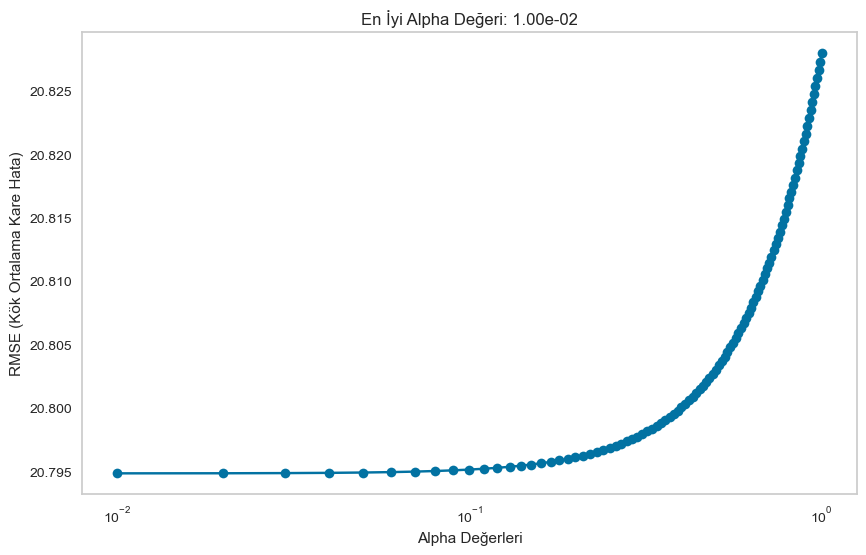

In [239]:
rmse_values = []
for alpha in alpha_space:
    lasso_model = Lasso(alpha=alpha, max_iter=100000, random_state=42)
    lasso_model.fit(X, y)
    y_pred = lasso_model.predict(X)
    rmse = np.sqrt(mean_squared_error(y, y_pred))
    rmse_values.append(rmse)

# Alpha değerlerini ve RMSE değerlerini görselleştirin
plt.figure(figsize=(10, 6))
plt.plot(alpha_space, rmse_values, marker='o')
plt.xscale('log')  # X eksenini logaritmik ölçekte ayarlayın
plt.xlabel('Alpha Değerleri')
plt.ylabel('RMSE (Kök Ortalama Kare Hata)')
plt.title(f'En İyi Alpha Değeri: {best_alpha:.2e}')
plt.grid()
plt.show()

In [240]:
y_pred = lasso_cv_model.predict(X_test_scaled)
y_train_pred = lasso_cv_model.predict(X_train_scaled)

In [241]:
lcs = train_val(y_train, y_train_pred, y_test, y_pred, "lasso_cv")
lcs

,lasso_cv_train,lasso_cv_test
R2,0.932086,0.925668
mae,8.549050,8.889676
mse,233.741294,251.071062
rmse,15.288600,15.845222


In [243]:
pd.concat([ls, rcs, lss, lcs], axis=1)

,linear_train,linear_test,rigde_cv_train,rigde_cv_test,lasso_train,lasso_test,lasso_cv_train,lasso_cv_test
R2,0.944211,0.935616,0.939696,0.932289,0.896507,0.890652,0.932086,0.925668
mae,6.897777,7.435432,7.241632,7.629174,11.442771,11.585262,8.549050,8.889676
mse,192.008604,217.468791,207.548910,228.707547,356.192164,369.346215,233.741294,251.071062
rmse,13.856717,14.746823,14.406558,15.123080,18.873054,19.218382,15.288600,15.845222


In [244]:
lasso_cv_model.coef_

array([-3.48553567e+01,  3.81760604e+01,  2.36504590e+01,  4.27503774e+01,
        0.00000000e+00,  1.07016058e+02,  1.88027103e+01,  0.00000000e+00,
        0.00000000e+00, -1.24459027e+01, -0.00000000e+00, -0.00000000e+00,
       -0.00000000e+00, -0.00000000e+00, -6.21542009e+01, -0.00000000e+00,
       -0.00000000e+00, -0.00000000e+00, -5.03958887e+00, -7.63471927e+00,
       -0.00000000e+00, -0.00000000e+00, -0.00000000e+00, -0.00000000e+00,
       -7.80565975e+01, -1.16793870e+02, -0.00000000e+00, -0.00000000e+00,
       -2.36473437e-02, -0.00000000e+00,  0.00000000e+00, -0.00000000e+00,
       -0.00000000e+00, -0.00000000e+00, -0.00000000e+00,  1.13365821e+01,
        3.73707247e+01,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00, -8.73454047e-01, -0.00000000e+00, -8.93093414e+00,
       -0.00000000e+00, -0.00000000e+00, -0.00000000e+00, -0.00000000e+00,
       -6.34486320e-01, -

In [247]:
lcm_df = pd.DataFrame(lasso_cv_model.coef_, columns = ["lasso_cv_coef_0.01"])

In [248]:
pd.concat([lm_df,  rcm_df, lsm_df, lcm_df], axis = 1)

,lm_coef,ridge_cv_model.coef_0.02,losso_coef_alpha_1,lasso_cv_coef_0.01
0,-1.859356e+01,33.868295,11.134039,-34.855357
1,-1.468246e+03,31.638951,18.200340,38.176060
2,-1.176129e+03,-116.322223,14.510297,23.650459
3,2.393937e+03,-95.000586,18.965643,42.750377
4,2.595150e+02,9.464481,0.000000,0.000000
...,...,...,...,...
64,6.940801e+05,259.556607,-0.000000,77.008226
65,-2.507525e+06,115.548498,-0.000000,-0.000000
66,-7.684079e+06,-11.299087,-0.000000,-16.931807
67,4.047766e+07,-50.045164,-0.000000,-25.662376


In [ ]:
final_model = LinearRegression()
final_model.fit(X, y)

In [ ]:
final_model.coef_

In [ ]:
coeff_df = pd.DataFrame(final_model.coef_, index = X.columns, columns = ["Coefficient"] )

In [ ]:
final_model.intercept_

In [ ]:
coeff_df